##  Step 1: Install & Import Required Libraries

In [1]:

!pip install pandas matplotlib seaborn ydata-profiling sweetviz -q

You should consider upgrading via the '/Users/shreyakhatri/Desktop/adv_project/venv/bin/python3 -m pip install --upgrade pip' command.


In [2]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['font.size'] = 12

print(" All libraries imported successfully!")

 All libraries imported successfully!


##  Step 2: Dynamic CSV Input / Upload

The cell below supports **two modes**:
1. **Direct file path** — provide the path to a CSV file on your local machine.
2. **Google Colab upload** — if running on Colab, a file upload widget will appear.

This makes the notebook **environment-agnostic**.

In [3]:
import pandas as pd

df = pd.read_csv("raw_transactions.csv")
df.head()

,transaction_id,user_id,amount,type,timestamp,device,location,prev_fraud,account_age_days,trans_24h,payment_method,is_fraud
0,TXN000000,25795,4754.06,POS,2025-11-21 23:19:49.723291,Mobile,New York,2,2199,18,Wallet,0
1,TXN000001,26023,3257.93,Online,2026-01-30 23:19:49.723373,Desktop,LA,1,1245,0,Debit Card,0
2,TXN000002,37480,1463.23,POS,2025-12-21 23:19:49.723405,ATM,LA,1,2764,18,Wallet,1
3,TXN000003,21394,4301.10,POS,2026-01-11 23:19:49.723431,Mobile,Chicago,1,2465,13,Debit Card,0
4,TXN000004,33897,497.38,Transfer,2025-12-03 23:19:49.723456,ATM,Houston,0,805,14,Wallet,0


##  Step 3: Initial Data Inspection — Shape, Columns, and Data Types

Understanding the **structure** of the dataset is the first critical step. We check:
- Number of rows (transactions) and columns (features)
- Column names and their data types
- First and last few records for a quick glance

In [4]:

print("=" * 60)
print(" DATASET OVERVIEW")
print("=" * 60)

print(f"\n Shape: {df.shape[0]:,} rows × {df.shape[1]} columns")
print(f"\n Column Names ({df.shape[1]} total):")
for i, col in enumerate(df.columns, 1):
    print(f"   {i:3d}. {col}")

 DATASET OVERVIEW

 Shape: 1,000 rows × 12 columns

 Column Names (12 total):
     1. transaction_id
     2. user_id
     3. amount
     4. type
     5. timestamp
     6. device
     7. location
     8. prev_fraud
     9. account_age_days
    10. trans_24h
    11. payment_method
    12. is_fraud


In [5]:
# Cell 9 - Code
print("\n Data Types:")
print("-" * 40)
dtype_df = df.dtypes.value_counts().reset_index()
dtype_df.columns = ['Data Type', 'Count']
print(dtype_df.to_string(index=False))

print("\n\n Detailed Column Info:")
print("-" * 60)
info_df = pd.DataFrame({
    'Column': df.columns,
    'Data Type': df.dtypes.values,
    'Non-Null Count': df.notnull().sum().values,
    'Null Count': df.isnull().sum().values,
    'Unique Values': df.nunique().values
})
print(info_df.to_string(index=False))


 Data Types:
----------------------------------------
Data Type  Count
   object      6
    int64      5
  float64      1


 Detailed Column Info:
------------------------------------------------------------
          Column Data Type  Non-Null Count  Null Count  Unique Values
  transaction_id    object            1000           0           1000
         user_id     int64            1000           0            988
          amount   float64            1000           0           1000
            type    object            1000           0              4
       timestamp    object            1000           0           1000
          device    object            1000           0              3
        location    object            1000           0              4
      prev_fraud     int64            1000           0              3
account_age_days     int64            1000           0            883
       trans_24h     int64            1000           0             20
  payment_method    o

In [6]:

print("\n First 5 Rows:")
df.head()


 First 5 Rows:


,transaction_id,user_id,amount,type,timestamp,device,location,prev_fraud,account_age_days,trans_24h,payment_method,is_fraud
0,TXN000000,25795,4754.06,POS,2025-11-21 23:19:49.723291,Mobile,New York,2,2199,18,Wallet,0
1,TXN000001,26023,3257.93,Online,2026-01-30 23:19:49.723373,Desktop,LA,1,1245,0,Debit Card,0
2,TXN000002,37480,1463.23,POS,2025-12-21 23:19:49.723405,ATM,LA,1,2764,18,Wallet,1
3,TXN000003,21394,4301.10,POS,2026-01-11 23:19:49.723431,Mobile,Chicago,1,2465,13,Debit Card,0
4,TXN000004,33897,497.38,Transfer,2025-12-03 23:19:49.723456,ATM,Houston,0,805,14,Wallet,0


In [7]:

print(" Last 5 Rows:")
df.tail()

 Last 5 Rows:


,transaction_id,user_id,amount,type,timestamp,device,location,prev_fraud,account_age_days,trans_24h,payment_method,is_fraud
995,TXN000995,43000,1257.91,Transfer,2025-12-23 23:19:49.744981,ATM,Chicago,0,735,9,Wallet,0
996,TXN000996,24184,4410.70,POS,2025-11-13 23:19:49.745002,Desktop,New York,0,2723,11,Debit Card,0
997,TXN000997,35411,1795.63,POS,2026-01-24 23:19:49.745023,ATM,Chicago,0,3397,2,Credit Card,0
998,TXN000998,15229,87.08,Transfer,2025-12-11 23:19:49.745045,Desktop,Houston,0,273,5,Debit Card,0
999,TXN000999,13088,2567.79,POS,2026-01-01 23:19:49.745066,Mobile,LA,2,2477,14,Wallet,0


In [8]:

print("\n Descriptive Statistics (Numerical Features):")
df.describe().T


 Descriptive Statistics (Numerical Features):


,count,mean,std,min,25%,50%,75%,max
user_id,1000.0,29656.85000,11491.348961,10009.00,19792.2500,29268.500,39199.7500,49932.00
amount,1000.0,2554.27709,1459.516705,10.93,1334.0775,2557.595,3792.0675,4988.49
prev_fraud,1000.0,1.00900,0.817060,0.00,0.0000,1.000,2.0000,2.00
account_age_days,1000.0,1780.57000,1045.773707,30.00,859.5000,1753.000,2687.7500,3635.00
trans_24h,1000.0,9.65500,5.935757,0.00,4.0000,10.000,15.0000,19.00
is_fraud,1000.0,0.04800,0.213873,0.00,0.0000,0.000,0.0000,1.00


In [9]:

# Descriptive statistics for categorical features (if any)
cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
if len(cat_cols) > 0:
    print("\n Descriptive Statistics (Categorical Features):")
    display(df[cat_cols].describe().T)
else:
    print("\n No categorical (object/category) columns found.")


 Descriptive Statistics (Categorical Features):


,count,unique,top,freq
transaction_id,1000,1000,TXN000000,1
type,1000,4,Online,254
timestamp,1000,1000,2025-11-21 23:19:49.723291,1
device,1000,3,Desktop,357
location,1000,4,Houston,264
payment_method,1000,3,Credit Card,347


###  Insight — Dataset Structure

> **Key Observations:**
> - The dataset shape, column names, and data types are displayed above.
> - Numerical vs categorical feature split is identified.
> - Unique value counts help identify potential **ID columns** (very high unique count) vs **categorical features** (low unique count).
> - This forms the foundation for all subsequent analysis steps.


##  Step 4: Missing Values Analysis

Missing data can significantly impact model performance. Here we identify:
- Which columns have missing values
- The percentage of missing data per column
- A visual heatmap of missingness

In [30]:

print("=" * 60)
print(" MISSING VALUES ANALYSIS")
print("=" * 60)

missing = df.isnull().sum()
missing_pct = (missing / len(df)) * 100
missing_df = pd.DataFrame({
    'Column': missing.index,
    'Missing Count': missing.values,
    'Missing %': missing_pct.values
}).sort_values(by='Missing %', ascending=False)

missing_df = missing_df[missing_df['Missing Count'] > 0]

if len(missing_df) == 0:
    print("\n No missing values found in the dataset!")
else:
    print(f"\n {len(missing_df)} columns have missing values:\n")
    print(missing_df.to_string(index=False))

total_missing = df.isnull().sum().sum()
total_cells = df.shape[0] * df.shape[1]
print(f"\n Total missing cells: {total_missing:,} out of {total_cells:,} ({(total_missing/total_cells)*100:.2f}%)")

 MISSING VALUES ANALYSIS

 No missing values found in the dataset!

 Total missing cells: 0 out of 27,000 (0.00%)


In [11]:

# Visualize missing values
if df.isnull().sum().sum() > 0:
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    # Bar chart of missing values
    cols_with_missing = df.columns[df.isnull().any()].tolist()
    missing_counts = df[cols_with_missing].isnull().sum().sort_values(ascending=True)
    missing_counts.plot(kind='barh', ax=axes[0], color='salmon', edgecolor='black')
    axes[0].set_title('Missing Values Count by Column', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Count')

    # Heatmap of missing values (sample if too large)
    sample_df = df[cols_with_missing].sample(min(1000, len(df)), random_state=42) if len(df) > 1000 else df[cols_with_missing]
    sns.heatmap(sample_df.isnull(), cbar=True, yticklabels=False, cmap='YlOrRd', ax=axes[1])
    axes[1].set_title('Missing Values Heatmap (Sampled)', fontsize=14, fontweight='bold')

    plt.tight_layout()
    plt.savefig('missing_values_analysis.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(" Chart saved as 'missing_values_analysis.png'")
else:
    print(" No missing values — skipping missing value visualization.")

 No missing values — skipping missing value visualization.


###  Insight — Missing Values

> **Key Observations:**
> - The missing values summary above shows which columns need attention during preprocessing.
> - If missing percentages are very high (>50%), those columns might be candidates for **dropping**.
> - Low missing percentages can be handled via **imputation** (mean, median, mode, or advanced methods).
> - The heatmap reveals if missingness follows any **pattern** (e.g., MNAR — Missing Not At Random).

#  Step 5: Feature Distributions

Understanding how each feature is distributed helps identify:
- **Skewness** — heavily skewed features may need transformation
- **Outliers** — extreme values visible in histograms/box plots
- **Scale differences** — features on vastly different scales

In [31]:

print("=" * 60)
print(" FEATURE DISTRIBUTIONS — NUMERICAL FEATURES")
print("=" * 60)

num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
print(f"\n Found {len(num_cols)} numerical columns: {num_cols}")

# Skewness analysis
print("\n Skewness Analysis:")
print("-" * 40)
skewness = df[num_cols].skew().sort_values(ascending=False)
for col, skew_val in skewness.items():
    if abs(skew_val) > 1:
        label = " Highly Skewed"
    elif abs(skew_val) > 0.5:
        label = "⚡ Moderately Skewed"
    else:
        label = " Approximately Symmetric"
    print(f"   {col:30s} → Skewness: {skew_val:8.2f}  {label}")
print(df.skew(numeric_only=True))

    

 FEATURE DISTRIBUTIONS — NUMERICAL FEATURES

 Found 15 numerical columns: ['user_id', 'amount', 'prev_fraud', 'account_age_days', 'trans_24h', 'is_fraud', 'hour', 'day_of_week', 'month', 'is_weekend', 'risk_score', 'is_weekend_night', 'high_freq_new_account', 'multi_location_user', 'high_amount_volatility']

 Skewness Analysis:
----------------------------------------
   multi_location_user            → Skewness:     6.87   Highly Skewed
   high_amount_volatility         → Skewness:     6.23   Highly Skewed
   is_fraud                       → Skewness:     4.24   Highly Skewed
   is_weekend                     → Skewness:     1.18   Highly Skewed
   is_weekend_night               → Skewness:     1.18   Highly Skewed
   day_of_week                    → Skewness:     0.10   Approximately Symmetric
   account_age_days               → Skewness:     0.07   Approximately Symmetric
   user_id                        → Skewness:     0.04   Approximately Symmetric
   risk_score                  

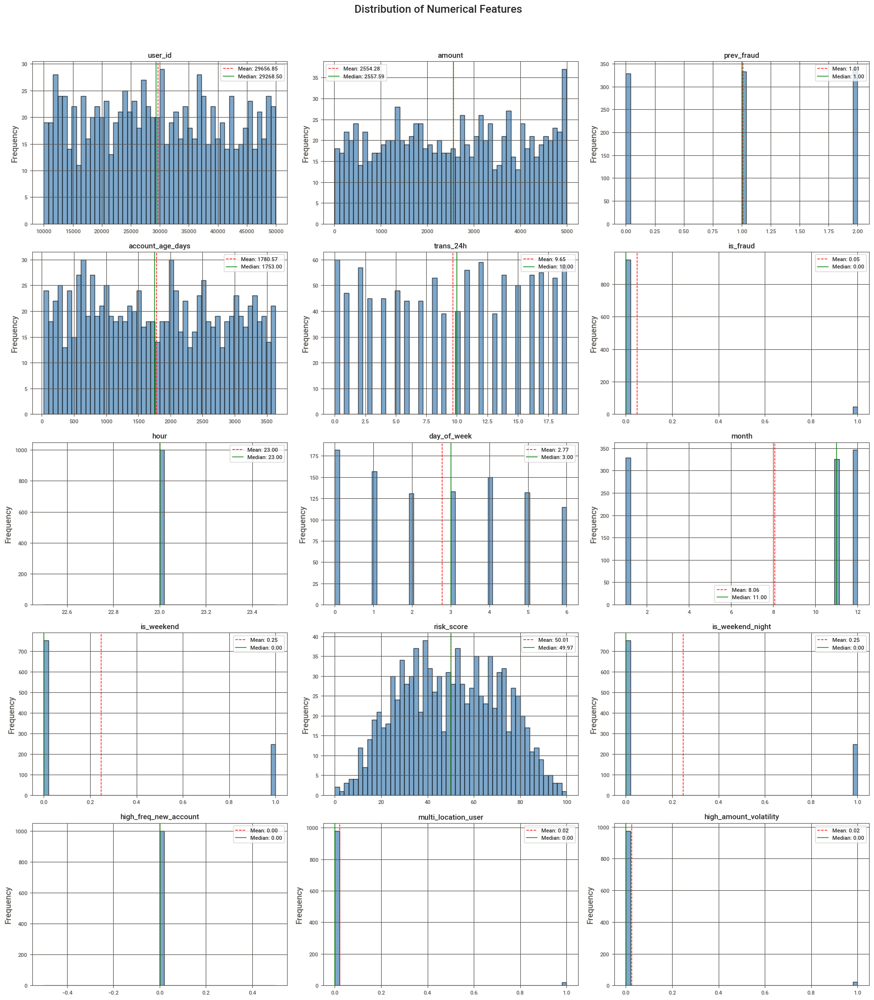

💾 Chart saved as 'feature_distributions_histograms.png'


In [32]:

# Histograms for all numerical features
n_num = len(num_cols)
if n_num > 0:
    n_cols_plot = 3
    n_rows_plot = int(np.ceil(n_num / n_cols_plot))
    fig, axes = plt.subplots(n_rows_plot, n_cols_plot, figsize=(6 * n_cols_plot, 4 * n_rows_plot))
    axes = axes.flatten() if n_num > 1 else [axes]

    for idx, col in enumerate(num_cols):
        ax = axes[idx]
        df[col].hist(bins=50, ax=ax, color='steelblue', edgecolor='black', alpha=0.7)
        ax.set_title(f'{col}', fontsize=11, fontweight='bold')
        ax.set_xlabel('')
        ax.set_ylabel('Frequency')
        ax.axvline(df[col].mean(), color='red', linestyle='--', linewidth=1, label=f'Mean: {df[col].mean():.2f}')
        ax.axvline(df[col].median(), color='green', linestyle='-', linewidth=1, label=f'Median: {df[col].median():.2f}')
        ax.legend(fontsize=8)    

    # Hide unused subplots
    for idx in range(n_num, len(axes)):
        axes[idx].set_visible(False)

    plt.suptitle(' Distribution of Numerical Features', fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig('feature_distributions_histograms.png', dpi=150, bbox_inches='tight')
    plt.show()
    print("💾 Chart saved as 'feature_distributions_histograms.png'")

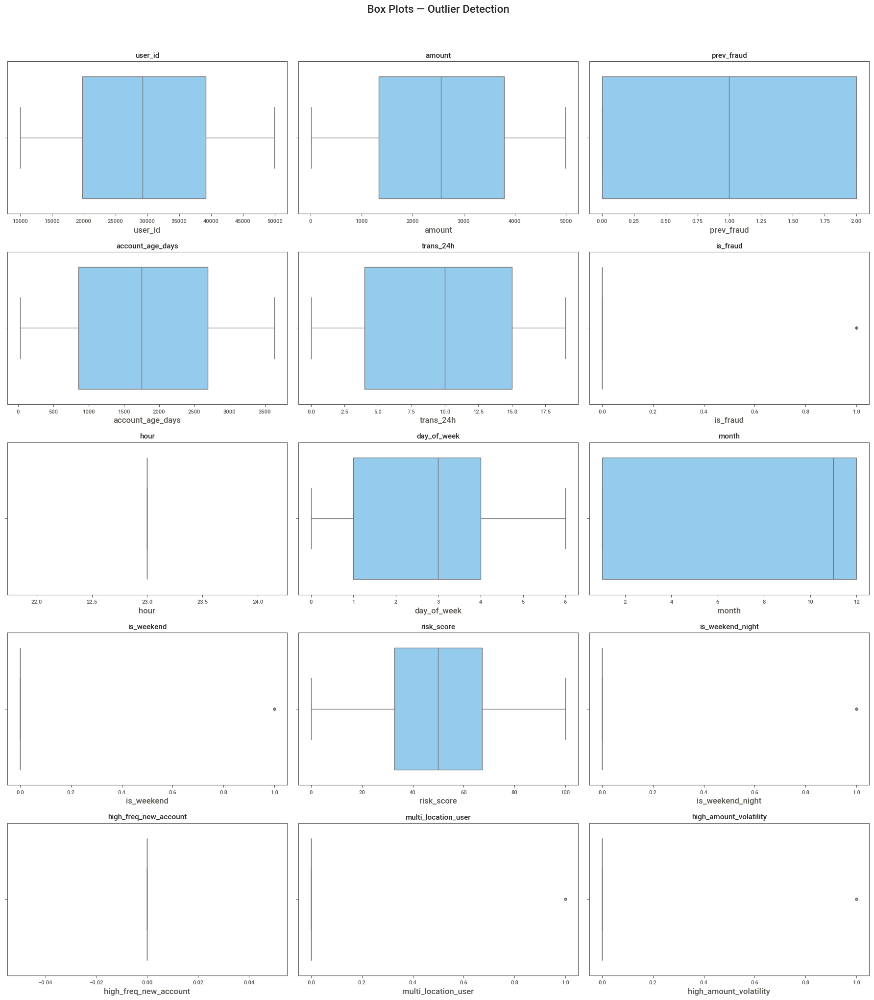

 Chart saved as 'feature_distributions_boxplots.png'


In [33]:

# Box plots to detect outliers
if n_num > 0:
    n_cols_plot = 3
    n_rows_plot = int(np.ceil(n_num / n_cols_plot))
    fig, axes = plt.subplots(n_rows_plot, n_cols_plot, figsize=(6 * n_cols_plot, 4 * n_rows_plot))
    axes = axes.flatten() if n_num > 1 else [axes]

    for idx, col in enumerate(num_cols):
        ax = axes[idx]
        sns.boxplot(x=df[col], ax=ax, color='lightskyblue', flierprops=dict(marker='o', markersize=3, alpha=0.5))
        ax.set_title(f'{col}', fontsize=11, fontweight='bold')

    for idx in range(n_num, len(axes)):
        axes[idx].set_visible(False)

    plt.suptitle(' Box Plots — Outlier Detection', fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig('feature_distributions_boxplots.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(" Chart saved as 'feature_distributions_boxplots.png'")

## Outlier Detection Count

In [34]:
for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    
    outliers = df[(df[col] < Q1 - 1.5*IQR) | (df[col] > Q3 + 1.5*IQR)]
    
    print(f"{col}: {len(outliers)} outliers")


user_id: 0 outliers
amount: 0 outliers
prev_fraud: 0 outliers
account_age_days: 0 outliers
trans_24h: 0 outliers
is_fraud: 48 outliers
hour: 0 outliers
day_of_week: 0 outliers
month: 0 outliers
is_weekend: 247 outliers
risk_score: 0 outliers
is_weekend_night: 247 outliers
high_freq_new_account: 0 outliers
multi_location_user: 20 outliers
high_amount_volatility: 24 outliers



 Found 11 categorical columns: ['transaction_id', 'type', 'device', 'location', 'payment_method', 'time_period', 'account_age_category', 'trans_frequency_category', 'amount_quintile', 'risk_category', 'customer_segment']

 transaction_id — 1000 unique values
    Too many unique values (1000) — showing top 10:
transaction_id
TXN000000    1
TXN000671    1
TXN000658    1
TXN000659    1
TXN000660    1
TXN000661    1
TXN000662    1
TXN000663    1
TXN000664    1
TXN000665    1

 type — 4 unique values


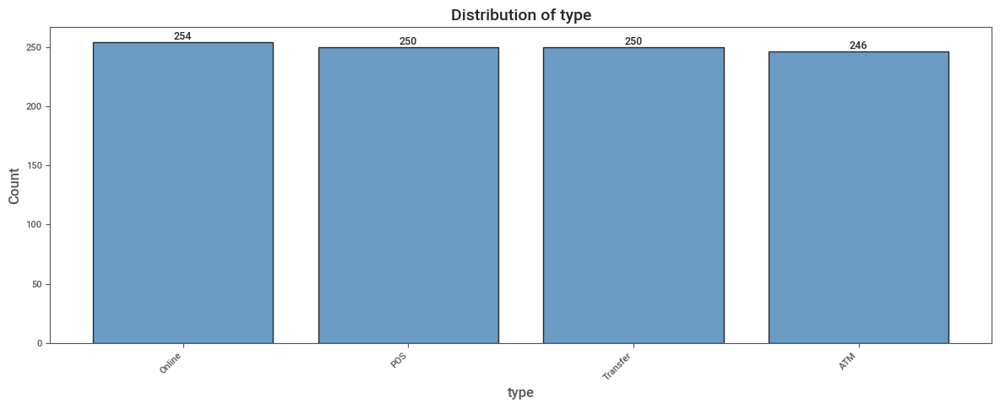

 Chart saved as 'distribution_type.png'

 device — 3 unique values


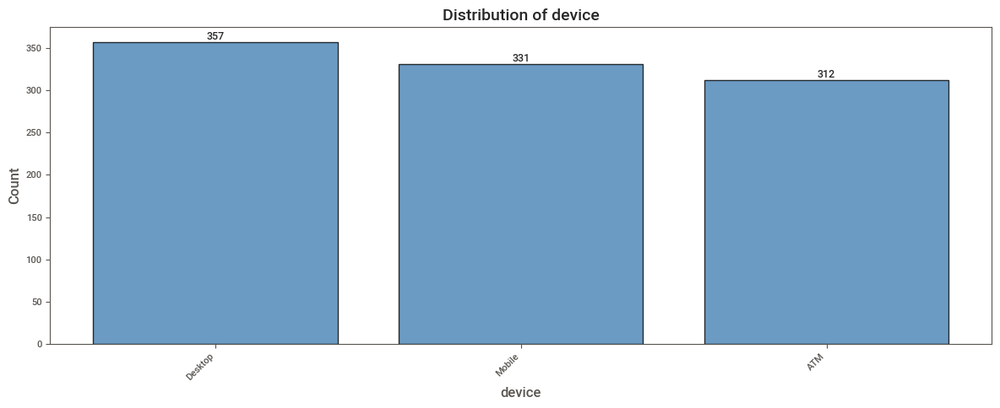

 Chart saved as 'distribution_device.png'

 location — 4 unique values


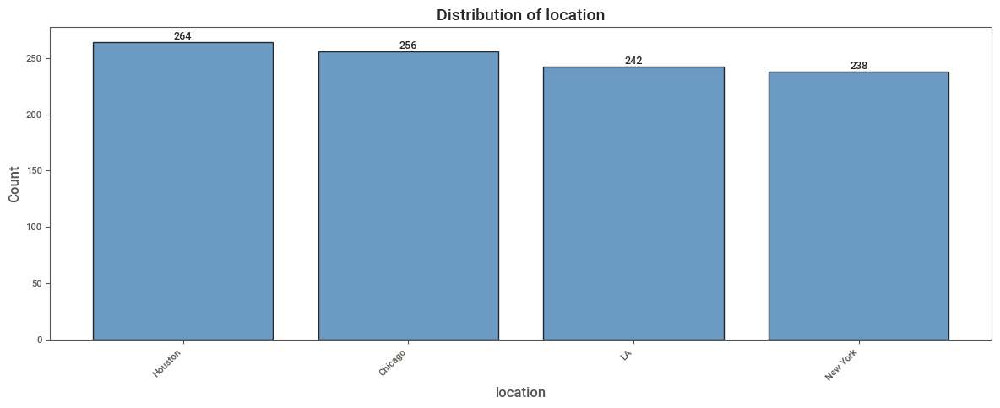

 Chart saved as 'distribution_location.png'

 payment_method — 3 unique values


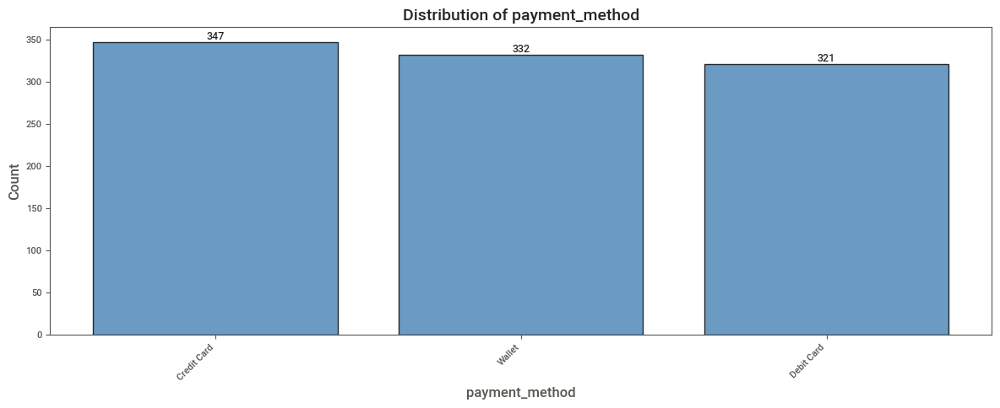

 Chart saved as 'distribution_payment_method.png'

 time_period — 1 unique values


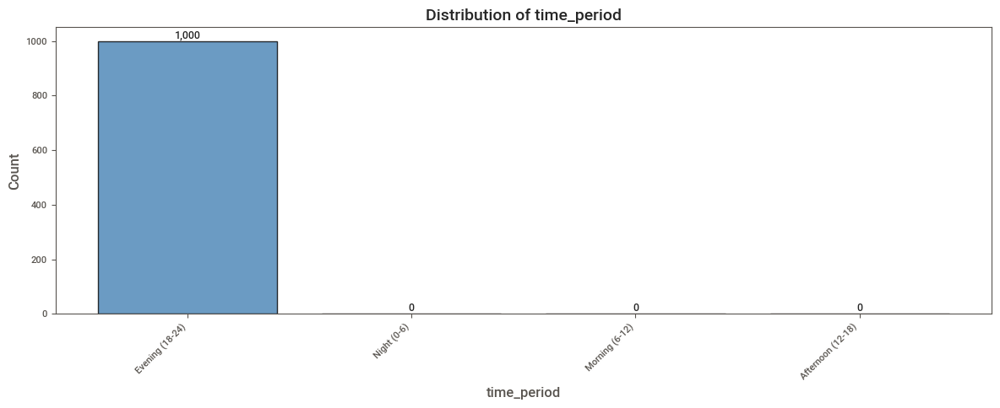

 Chart saved as 'distribution_time_period.png'

 account_age_category — 5 unique values


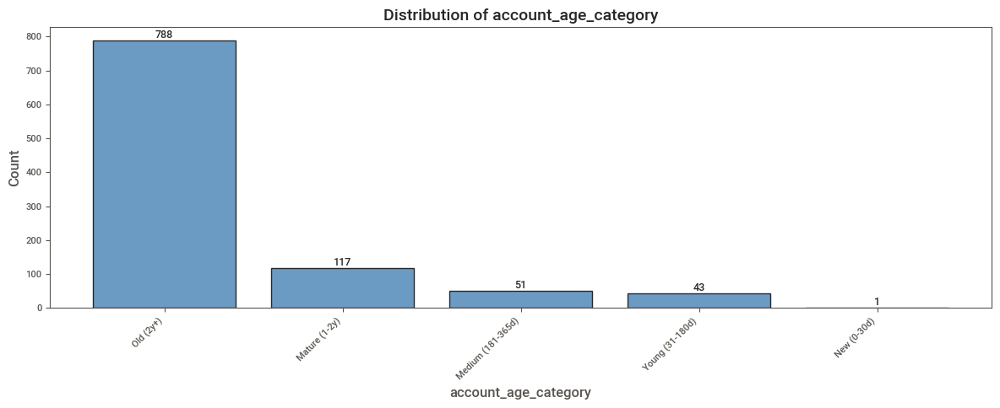

 Chart saved as 'distribution_account_age_category.png'

 trans_frequency_category — 4 unique values


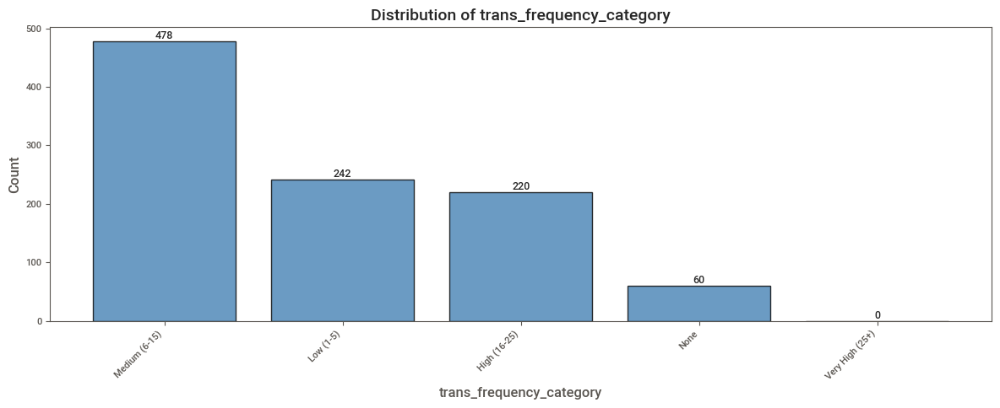

 Chart saved as 'distribution_trans_frequency_category.png'

 amount_quintile — 5 unique values


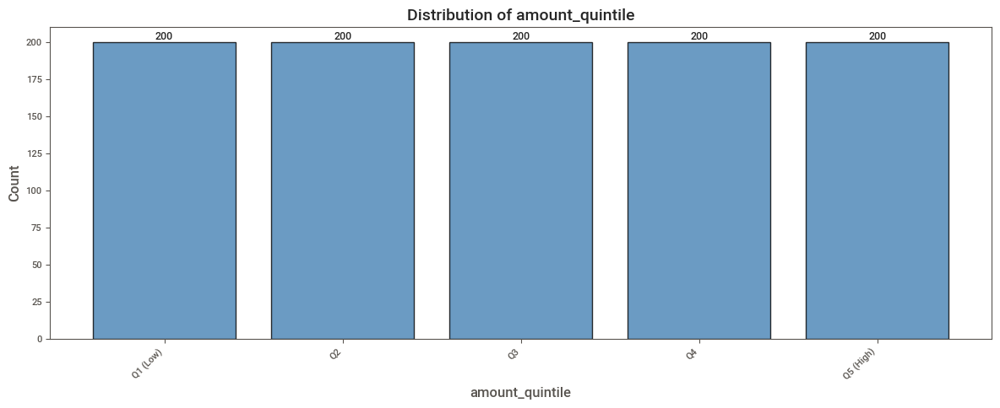

 Chart saved as 'distribution_amount_quintile.png'

 risk_category — 5 unique values


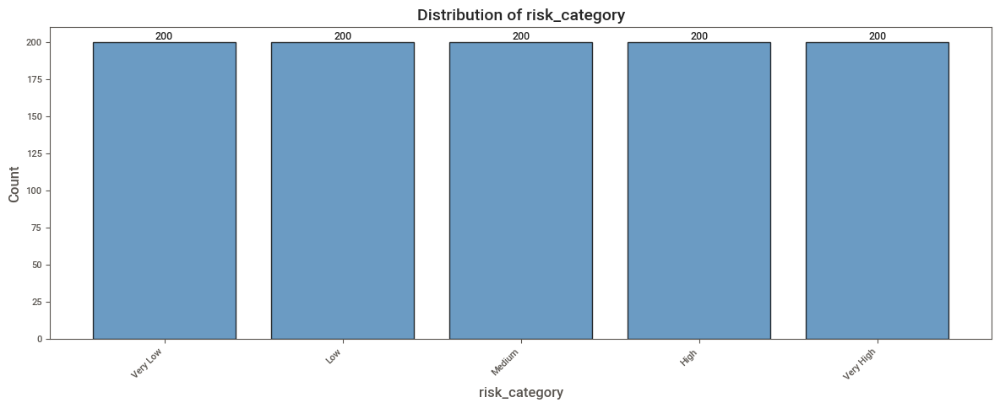

 Chart saved as 'distribution_risk_category.png'

 customer_segment — 6 unique values


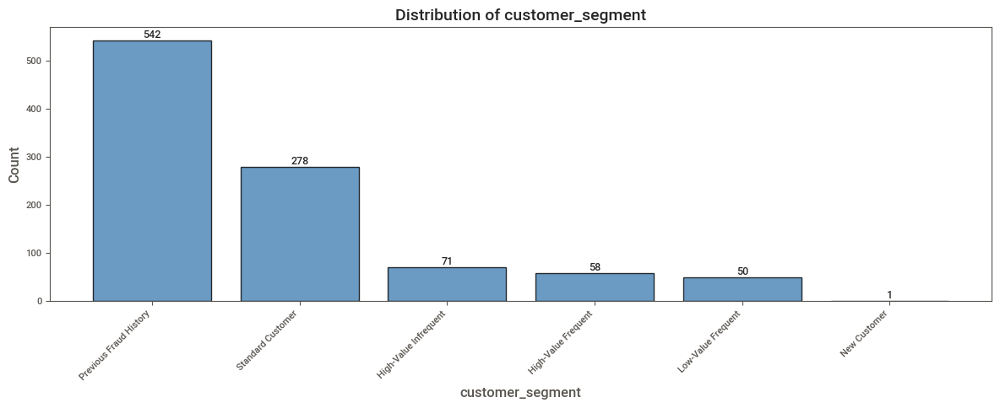

 Chart saved as 'distribution_customer_segment.png'


In [35]:

# Bar charts for categorical features
cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
print(f"\n Found {len(cat_cols)} categorical columns: {cat_cols}")

if len(cat_cols) > 0:
    for col in cat_cols:
        n_unique = df[col].nunique()
        print(f"\n {col} — {n_unique} unique values")

        if n_unique <= 30:  # Only plot if reasonable number of categories
            plt.figure(figsize=(12, 5))
            value_counts = df[col].value_counts().head(20)
            bars = plt.bar(value_counts.index.astype(str), value_counts.values, 
                          color='steelblue', edgecolor='black', alpha=0.8)
            plt.title(f'Distribution of {col}', fontsize=14, fontweight='bold')
            plt.xlabel(col)
            plt.ylabel('Count')
            plt.xticks(rotation=45, ha='right')

            # Add value labels on bars
            for bar in bars:
                height = bar.get_height()
                plt.text(bar.get_x() + bar.get_width()/2., height,
                        f'{int(height):,}', ha='center', va='bottom', fontsize=9)

            plt.tight_layout()
            plt.savefig(f'distribution_{col}.png', dpi=150, bbox_inches='tight')
            plt.show()
            print(f" Chart saved as 'distribution_{col}.png'")
        else:
            print(f"    Too many unique values ({n_unique}) — showing top 10:")
            print(df[col].value_counts().head(10).to_string())
else:
    print(" No categorical columns found.")

###  Insight — Feature Distributions

> **Key Observations:**
> - Histograms reveal the **shape** of each numerical feature's distribution (normal, skewed, bimodal, etc.).
> - The **red dashed line (mean)** vs **green solid line (median)** gap indicates skewness — large gaps mean heavy skew.
> - Box plots expose **outliers** — points beyond the whiskers. Fraud datasets often have extreme outliers in transaction amounts.
> - Highly skewed features (skewness > 1) may benefit from **log transformation** during preprocessing.
> - Categorical bar charts show the frequency of each category and help spot **dominant categories**.

##  Step 6: Correlation Analysis

Correlation analysis identifies:
- **Highly correlated feature pairs** — potential multicollinearity issues
- **Features correlated with the target** — most predictive features
- **Redundant features** — candidates for removal

 CORRELATION ANALYSIS


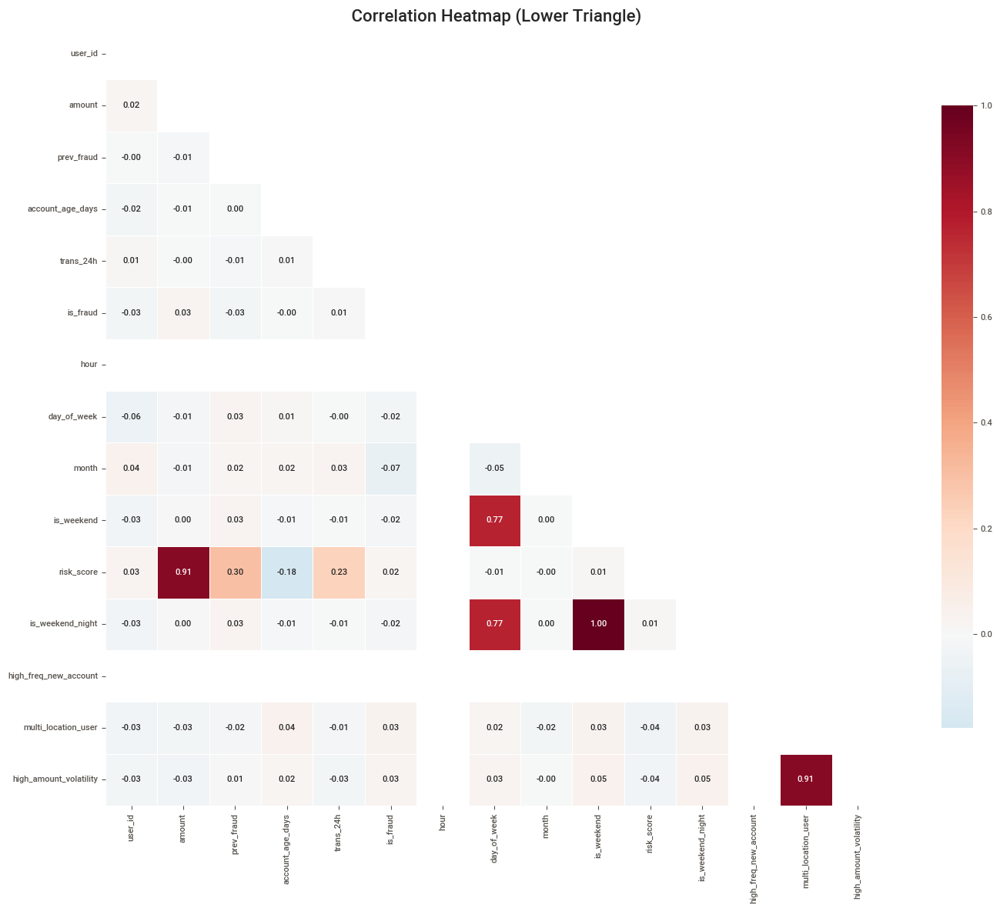

 Chart saved as 'correlation_heatmap.png'


In [36]:

print("=" * 60)
print(" CORRELATION ANALYSIS")
print("=" * 60)

num_cols = df.select_dtypes(include=[np.number]).columns.tolist()

if len(num_cols) >= 2:
    corr_matrix = df[num_cols].corr()

    # Full correlation heatmap
    plt.figure(figsize=(min(20, len(num_cols) * 0.8 + 4), min(16, len(num_cols) * 0.6 + 3)))
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    sns.heatmap(corr_matrix, mask=mask, annot=len(num_cols) <= 20, 
                fmt='.2f', cmap='RdBu_r', center=0, 
                square=True, linewidths=0.5,
                cbar_kws={'shrink': 0.8},
                annot_kws={'size': 8})
    plt.title(' Correlation Heatmap (Lower Triangle)', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig('correlation_heatmap.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(" Chart saved as 'correlation_heatmap.png'")
else:
    print(" Not enough numerical columns for correlation analysis.")

In [37]:

# Find highly correlated pairs
if len(num_cols) >= 2:
    print("\n Highly Correlated Feature Pairs (|r| > 0.7):")
    print("-" * 60)
    high_corr_pairs = []
    for i in range(len(corr_matrix.columns)):
        for j in range(i + 1, len(corr_matrix.columns)):
            if abs(corr_matrix.iloc[i, j]) > 0.7:
                high_corr_pairs.append({
                    'Feature 1': corr_matrix.columns[i],
                    'Feature 2': corr_matrix.columns[j],
                    'Correlation': corr_matrix.iloc[i, j]
                })

    if high_corr_pairs:
        high_corr_df = pd.DataFrame(high_corr_pairs).sort_values(by='Correlation', ascending=False)
        print(high_corr_df.to_string(index=False))
    else:
        print(" No highly correlated pairs found (|r| > 0.7).")


 Highly Correlated Feature Pairs (|r| > 0.7):
------------------------------------------------------------
          Feature 1              Feature 2  Correlation
         is_weekend       is_weekend_night     1.000000
multi_location_user high_amount_volatility     0.911006
             amount             risk_score     0.905576
        day_of_week             is_weekend     0.767128
        day_of_week       is_weekend_night     0.767128



 Correlation with Target Variable: 'is_fraud'
--------------------------------------------------


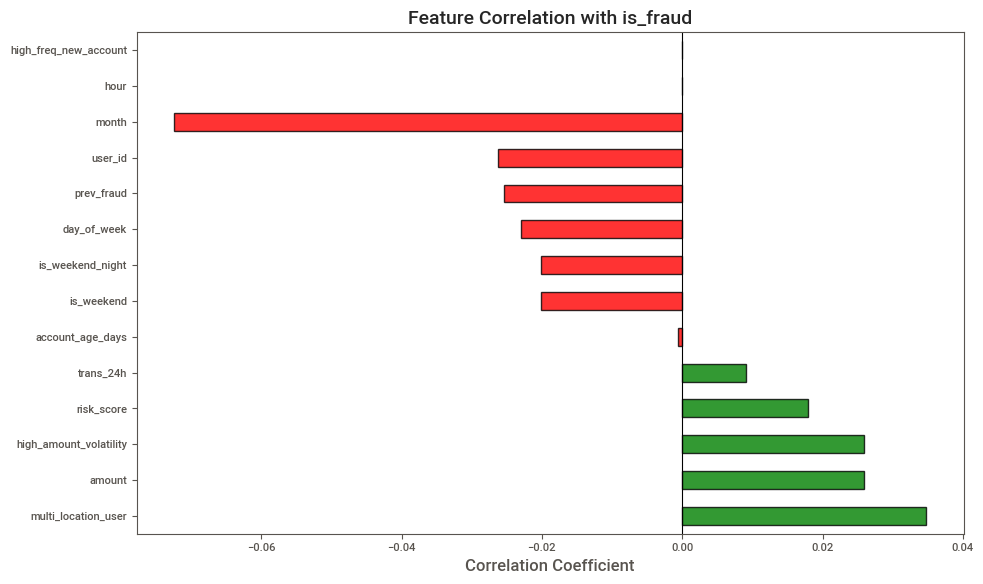

 Chart saved as 'target_correlation.png'

Top Positively Correlated:
    multi_location_user            → +0.0348
    amount                         → +0.0260
    high_amount_volatility         → +0.0259
    risk_score                     → +0.0180
    trans_24h                      → +0.0091

Top Negatively Correlated:
    prev_fraud                     → -0.0254
    user_id                        → -0.0263
    month                          → -0.0724
    hour                           → +nan
    high_freq_new_account          → +nan


In [38]:

# Correlation with target variable (auto-detect common target names)
target_candidates = ['isFraud', 'is_fraud', 'fraud', 'Fraud', 'Class', 'class', 'label', 'Label', 'target', 'Target']
target_col = None

for candidate in target_candidates:
    if candidate in df.columns:
        target_col = candidate
        break

if target_col is None:
    print("\n Could not auto-detect target column.")
    print(f"   Available columns: {df.columns.tolist()}")
    target_input = input("   Enter the target column name: ").strip()
    if target_input in df.columns:
        target_col = target_input

if target_col and target_col in num_cols:
    print(f"\n Correlation with Target Variable: '{target_col}'")
    print("-" * 50)
    target_corr = corr_matrix[target_col].drop(target_col).sort_values(ascending=False)
    
    plt.figure(figsize=(10, max(6, len(target_corr) * 0.3)))
    colors = ['green' if x > 0 else 'red' for x in target_corr.values]
    target_corr.plot(kind='barh', color=colors, edgecolor='black', alpha=0.8)
    plt.title(f'Feature Correlation with {target_col}', fontsize=14, fontweight='bold')
    plt.xlabel('Correlation Coefficient')
    plt.axvline(x=0, color='black', linewidth=0.8)
    plt.tight_layout()
    plt.savefig('target_correlation.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(" Chart saved as 'target_correlation.png'")

    print("\nTop Positively Correlated:")
    for col, val in target_corr.head(5).items():
        print(f"    {col:30s} → {val:+.4f}")
    print("\nTop Negatively Correlated:")
    for col, val in target_corr.tail(5).items():
        print(f"    {col:30s} → {val:+.4f}")

##  Insight — Correlations

> **Key Observations:**
> - The heatmap reveals **linear relationships** between features.
> - Highly correlated pairs (|r| > 0.7) indicate **multicollinearity** — one of the pair may be redundant.
> - Features with **strong correlation to the target** are the most useful predictors for fraud detection.
> - Near-zero correlation with the target doesn't mean uselessness — **non-linear relationships** may still exist.
> - This analysis guides feature selection during preprocessing.

##  Step 7: Class Imbalance Analysis

Fraud detection is inherently an **imbalanced classification** problem. Most transactions are legitimate, while fraudulent ones are rare. This step quantifies the imbalance.

 CLASS IMBALANCE ANALYSIS

 Target Variable: 'is_fraud'
   Number of classes: 2

 Class Distribution:
----------------------------------------
   Class 0:        952 samples (95.2000%)
   Class 1:         48 samples (4.8000%)

 Imbalance Ratio: 19.83:1 (Majority:Minority)
    SEVERE imbalance detected! Consider SMOTE, undersampling, or class weights.


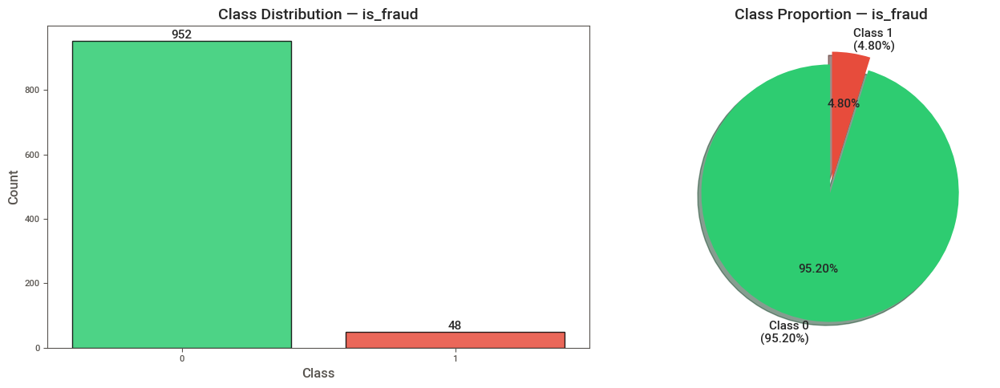

 Chart saved as 'class_imbalance.png'


In [39]:

print("=" * 60)
print(" CLASS IMBALANCE ANALYSIS")
print("=" * 60)

if target_col:
    class_dist = df[target_col].value_counts()
    class_pct = df[target_col].value_counts(normalize=True) * 100

    print(f"\n Target Variable: '{target_col}'")
    print(f"   Number of classes: {df[target_col].nunique()}")
    print(f"\n Class Distribution:")
    print("-" * 40)
    for cls, count in class_dist.items():
        pct = class_pct[cls]
        print(f"   Class {cls}: {count:>10,} samples ({pct:.4f}%)")

    # Imbalance ratio
    majority = class_dist.max()
    minority = class_dist.min()
    imbalance_ratio = majority / minority
    print(f"\n Imbalance Ratio: {imbalance_ratio:.2f}:1 (Majority:Minority)")

    if imbalance_ratio > 10:
        print(f"    SEVERE imbalance detected! Consider SMOTE, undersampling, or class weights.")
    elif imbalance_ratio > 3:
        print(f"    Moderate imbalance. Stratified sampling and class weights recommended.")
    else:
        print(f"    Relatively balanced dataset.")

    # Visualization
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Bar chart
    bars = axes[0].bar(class_dist.index.astype(str), class_dist.values, 
                       color=['#2ecc71', '#e74c3c'], edgecolor='black', alpha=0.85)
    axes[0].set_title(f'Class Distribution — {target_col}', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Class')
    axes[0].set_ylabel('Count')
    for bar in bars:
        height = bar.get_height()
        axes[0].text(bar.get_x() + bar.get_width()/2., height,
                    f'{int(height):,}', ha='center', va='bottom', fontsize=11, fontweight='bold')

    # Pie chart
    axes[1].pie(class_dist.values, labels=[f'Class {c}\n({class_pct[c]:.2f}%)' for c in class_dist.index],
                colors=['#2ecc71', '#e74c3c'], autopct='%1.2f%%', startangle=90,
                explode=[0.05] * len(class_dist), shadow=True, textprops={'fontsize': 11})
    axes[1].set_title(f'Class Proportion — {target_col}', fontsize=14, fontweight='bold')

    plt.tight_layout()
    plt.savefig('class_imbalance.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(" Chart saved as 'class_imbalance.png'")
else:
    print(" Target column not identified. Cannot perform class imbalance analysis.")

### Insight — Class Imbalance

> **Key Observations:**
> - Fraud datasets are almost always **highly imbalanced** — legitimate transactions vastly outnumber fraudulent ones.
> - The **imbalance ratio** quantifies how skewed the classes are.
> - A ratio > 10:1 means standard classifiers will be **biased toward the majority class**.
> - **Mitigation strategies** (to be applied during preprocessing):
>   - **SMOTE** (Synthetic Minority Oversampling)
>   - **Random Undersampling** of the majority class
>   - **Class weights** in the model (e.g., `class_weight='balanced'`)
>   - Use **precision, recall, F1-score, AUC-ROC** instead of accuracy for evaluation.

##  Step 8: Additional Visualizations — Fraud vs Non-Fraud Comparison

Comparing feature distributions between fraud and non-fraud classes reveals **discriminative features**.

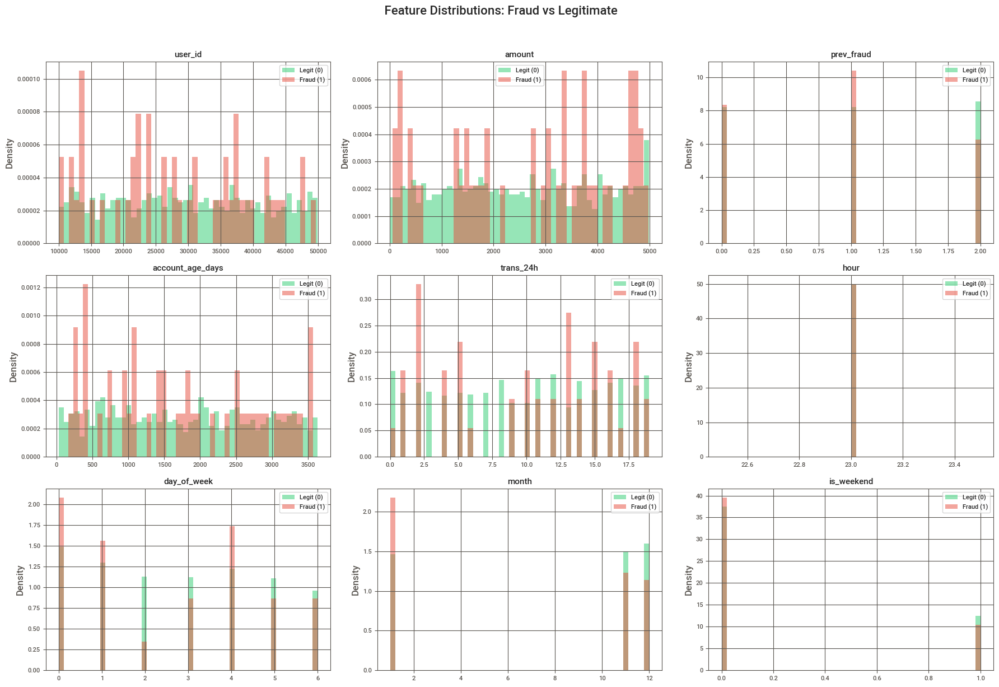

 Chart saved as 'fraud_vs_legit_distributions.png'


In [40]:

if target_col:
    # Select top numerical features to compare (exclude target)
    compare_cols = [c for c in num_cols if c != target_col]

    # Limit to first 9 for readability
    compare_cols = compare_cols[:9]

    if len(compare_cols) > 0:
        n_cols_plot = 3
        n_rows_plot = int(np.ceil(len(compare_cols) / n_cols_plot))
        fig, axes = plt.subplots(n_rows_plot, n_cols_plot, figsize=(6 * n_cols_plot, 4 * n_rows_plot))
        axes = axes.flatten() if len(compare_cols) > 1 else [axes]

        for idx, col in enumerate(compare_cols):
            ax = axes[idx]
            for cls in sorted(df[target_col].unique()):
                label = f'Fraud ({cls})' if cls == 1 else f'Legit ({cls})'
                color = '#e74c3c' if cls == 1 else '#2ecc71'
                df[df[target_col] == cls][col].hist(bins=50, ax=ax, alpha=0.5, 
                                                      label=label, color=color, density=True)
            ax.set_title(f'{col}', fontsize=11, fontweight='bold')
            ax.legend(fontsize=8)
            ax.set_ylabel('Density')

        for idx in range(len(compare_cols), len(axes)):
            axes[idx].set_visible(False)

        plt.suptitle(' Feature Distributions: Fraud vs Legitimate', fontsize=16, fontweight='bold', y=1.02)
        plt.tight_layout()
        plt.savefig('fraud_vs_legit_distributions.png', dpi=150, bbox_inches='tight')
        plt.show()
        print(" Chart saved as 'fraud_vs_legit_distributions.png'")

###  Insight — Fraud vs Legitimate Comparison

> **Key Observations:**
> - Features where **fraud (red) and legitimate (green) distributions differ significantly** are the most discriminative.
> - Overlapping distributions indicate the feature alone is **not sufficient** to distinguish classes.
> - Features with clear separation are prime candidates for the model.

##  Step 9: Temporal Analysis - Transaction Patterns Over Time
Analyzing  dataset's time-based patterns to discover unique insights about fraud patterns, user behavior, and seasonal trends.

 TEMPORAL ANALYSIS - TRANSACTION PATTERNS

 FRAUD PATTERNS BY TIME:
----------------------------------------
Top 5 hours with highest fraud rates:
      Total_Transactions  Fraud_Count  Fraud_Rate
hour                                             
23                  1000           48       0.048

 Weekend vs Weekday Fraud:
         count      mean
Weekday    753  0.050465
Weekend    247  0.040486


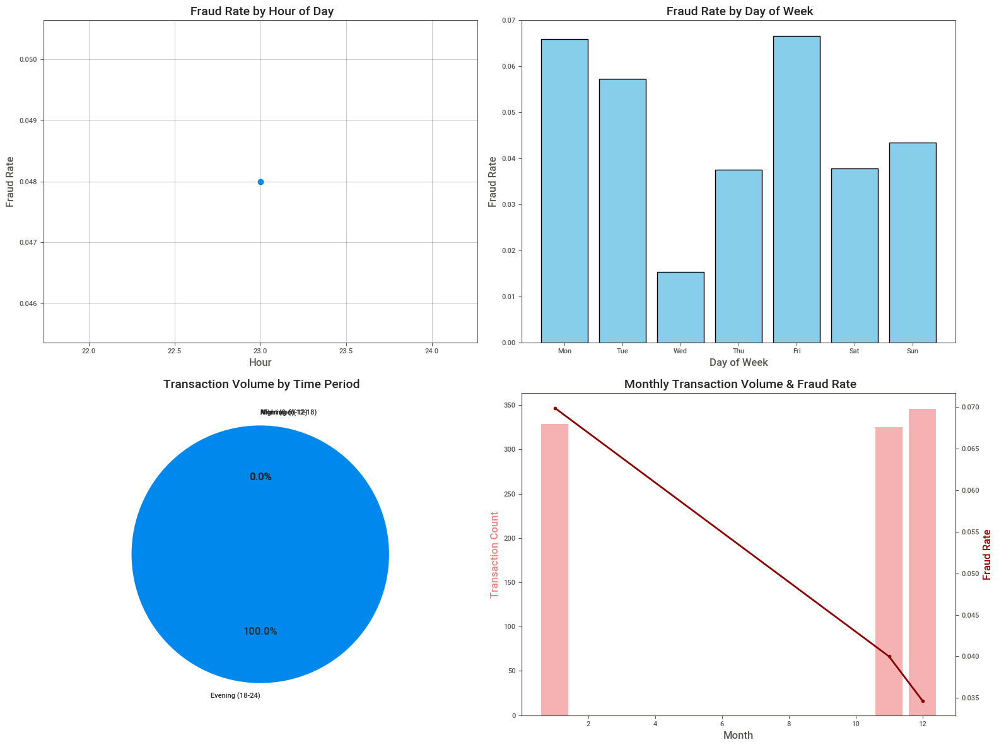


 Temporal analysis completed. Chart saved as 'temporal_fraud_analysis.png'


In [45]:
# Advanced Temporal Analysis - Dataset-Specific Insights
print("=" * 70)
print(" TEMPORAL ANALYSIS - TRANSACTION PATTERNS")
print("=" * 70)

# Convert timestamp to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract temporal features
df['hour'] = df['timestamp'].dt.hour
df['day_of_week'] = df['timestamp'].dt.dayofweek  # 0=Monday, 6=Sunday
df['month'] = df['timestamp'].dt.month
df['is_weekend'] = df['day_of_week'].isin([5, 6]).astype(int)

# Create time periods
df['time_period'] = pd.cut(df['hour'], 
                          bins=[0, 6, 12, 18, 24], 
                          labels=['Night (0-6)', 'Morning (6-12)', 'Afternoon (12-18)', 'Evening (18-24)'],
                          include_lowest=True)

# Fraud rate by time periods
print("\n FRAUD PATTERNS BY TIME:")
print("-" * 40)

fraud_by_hour = df.groupby('hour')['is_fraud'].agg(['count', 'sum', 'mean']).round(3)
fraud_by_hour.columns = ['Total_Transactions', 'Fraud_Count', 'Fraud_Rate']
print("Top 5 hours with highest fraud rates:")
print(fraud_by_hour.sort_values('Fraud_Rate', ascending=False).head())

print(f"\n Weekend vs Weekday Fraud:")
weekend_fraud = df.groupby('is_weekend')['is_fraud'].agg(['count', 'mean'])
weekend_fraud.index = ['Weekday', 'Weekend']
print(weekend_fraud)

# Visualize temporal patterns
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Hourly fraud pattern
hourly_fraud = df.groupby('hour')['is_fraud'].mean()
axes[0,0].plot(hourly_fraud.index, hourly_fraud.values, marker='o', linewidth=2, markersize=6)
axes[0,0].set_title(' Fraud Rate by Hour of Day', fontsize=14, fontweight='bold')
axes[0,0].set_xlabel('Hour')
axes[0,0].set_ylabel('Fraud Rate')
axes[0,0].grid(True, alpha=0.3)

# 2. Day of week pattern
dow_names = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
dow_fraud = df.groupby('day_of_week')['is_fraud'].mean()
axes[0,1].bar(range(7), dow_fraud.values, color='skyblue', edgecolor='black')
axes[0,1].set_title(' Fraud Rate by Day of Week', fontsize=14, fontweight='bold')
axes[0,1].set_xlabel('Day of Week')
axes[0,1].set_ylabel('Fraud Rate')
axes[0,1].set_xticks(range(7))
axes[0,1].set_xticklabels(dow_names)

# 3. Transaction volume by time period
time_period_counts = df['time_period'].value_counts()
axes[1,0].pie(time_period_counts.values, labels=time_period_counts.index, autopct='%1.1f%%', startangle=90)
axes[1,0].set_title(' Transaction Volume by Time Period', fontsize=14, fontweight='bold')

# 4. Monthly trend
monthly_fraud = df.groupby('month')['is_fraud'].agg(['count', 'mean'])
ax2 = axes[1,1]
ax2_twin = ax2.twinx()

bars = ax2.bar(monthly_fraud.index, monthly_fraud['count'], alpha=0.6, color='lightcoral', label='Transaction Count')
line = ax2_twin.plot(monthly_fraud.index, monthly_fraud['mean'], color='darkred', marker='o', linewidth=2, label='Fraud Rate')

ax2.set_xlabel('Month')
ax2.set_ylabel('Transaction Count', color='lightcoral')
ax2_twin.set_ylabel('Fraud Rate', color='darkred')
ax2.set_title(' Monthly Transaction Volume & Fraud Rate', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig('temporal_fraud_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n Temporal analysis completed. Chart saved as 'temporal_fraud_analysis.png'")

## Step 10: Geospatial & Device Analysis
Analyze location and device patterns specific to transaction dataset.

 GEOSPATIAL & DEVICE INTELLIGENCE
 LOCATION-BASED FRAUD PATTERNS:
---------------------------------------------
          Total_Transactions  Fraud_Count  Fraud_Rate
location                                             
LA                       242           13       0.054
Chicago                  256           13       0.051
Houston                  264           12       0.045
New York                 238           10       0.042

 DEVICE-BASED FRAUD PATTERNS:
---------------------------------------------
         Total_Transactions  Fraud_Count  Fraud_Rate
device                                              
ATM                     312           17       0.054
Desktop                 357           16       0.045
Mobile                  331           15       0.045

 PAYMENT METHOD FRAUD PATTERNS:
---------------------------------------------
                Total_Transactions  Fraud_Count  Fraud_Rate
payment_method                                             
Credit Card            

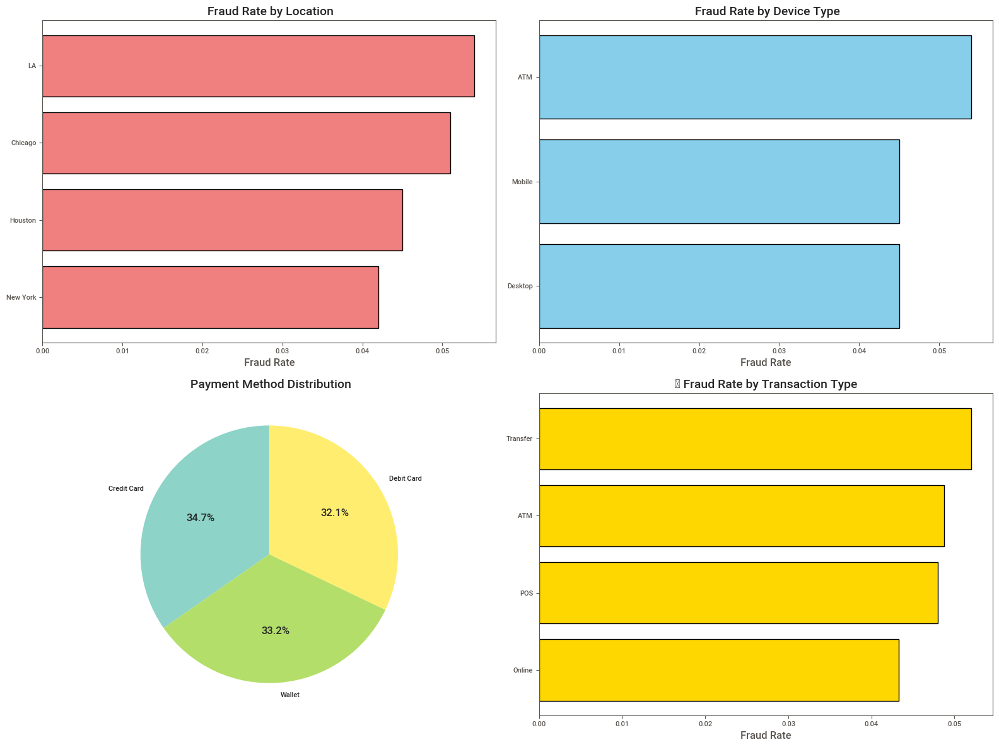


 Geospatial & Device analysis completed. Chart saved as 'geospatial_device_analysis.png'


In [47]:
# Advanced Geospatial and Device Analysis
print("=" * 70)
print(" GEOSPATIAL & DEVICE INTELLIGENCE")
print("=" * 70)

# Location-based fraud analysis
print(" LOCATION-BASED FRAUD PATTERNS:")
print("-" * 45)

location_analysis = df.groupby('location')['is_fraud'].agg(['count', 'sum', 'mean']).round(3)
location_analysis.columns = ['Total_Transactions', 'Fraud_Count', 'Fraud_Rate']
location_analysis = location_analysis.sort_values('Fraud_Rate', ascending=False)
print(location_analysis)

# Device-based fraud analysis
print(f"\n DEVICE-BASED FRAUD PATTERNS:")
print("-" * 45)

device_analysis = df.groupby('device')['is_fraud'].agg(['count', 'sum', 'mean']).round(3)
device_analysis.columns = ['Total_Transactions', 'Fraud_Count', 'Fraud_Rate']
device_analysis = device_analysis.sort_values('Fraud_Rate', ascending=False)
print(device_analysis)

# Payment method analysis
print(f"\n PAYMENT METHOD FRAUD PATTERNS:")
print("-" * 45)

payment_analysis = df.groupby('payment_method')['is_fraud'].agg(['count', 'sum', 'mean']).round(3)
payment_analysis.columns = ['Total_Transactions', 'Fraud_Count', 'Fraud_Rate']
payment_analysis = payment_analysis.sort_values('Fraud_Rate', ascending=False)
print(payment_analysis)

# Cross-tabulation analysis
print(f"\n CROSS-ANALYSIS: Location vs Device Fraud Risk:")
print("-" * 55)

cross_analysis = pd.crosstab(df['location'], df['device'], df['is_fraud'], aggfunc='mean').round(3)
print(cross_analysis)

# Visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Location fraud rates
location_fraud = location_analysis['Fraud_Rate'].sort_values(ascending=True)
axes[0,0].barh(range(len(location_fraud)), location_fraud.values, color='lightcoral', edgecolor='black')
axes[0,0].set_yticks(range(len(location_fraud)))
axes[0,0].set_yticklabels(location_fraud.index)
axes[0,0].set_title(' Fraud Rate by Location', fontsize=14, fontweight='bold')
axes[0,0].set_xlabel('Fraud Rate')

# 2. Device fraud rates  
device_fraud = device_analysis['Fraud_Rate'].sort_values(ascending=True)
axes[0,1].barh(range(len(device_fraud)), device_fraud.values, color='skyblue', edgecolor='black')
axes[0,1].set_yticks(range(len(device_fraud)))
axes[0,1].set_yticklabels(device_fraud.index)
axes[0,1].set_title(' Fraud Rate by Device Type', fontsize=14, fontweight='bold')
axes[0,1].set_xlabel('Fraud Rate')

# 3. Payment method distribution
payment_counts = df['payment_method'].value_counts()
colors = plt.cm.Set3(np.linspace(0, 1, len(payment_counts)))
axes[1,0].pie(payment_counts.values, labels=payment_counts.index, autopct='%1.1f%%', 
              colors=colors, startangle=90)
axes[1,0].set_title(' Payment Method Distribution', fontsize=14, fontweight='bold')

# 4. Transaction type vs fraud
type_fraud = df.groupby('type')['is_fraud'].mean().sort_values(ascending=True)
axes[1,1].barh(range(len(type_fraud)), type_fraud.values, color='gold', edgecolor='black')
axes[1,1].set_yticks(range(len(type_fraud)))
axes[1,1].set_yticklabels(type_fraud.index)
axes[1,1].set_title('💼 Fraud Rate by Transaction Type', fontsize=14, fontweight='bold')
axes[1,1].set_xlabel('Fraud Rate')

plt.tight_layout()
plt.savefig('geospatial_device_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n Geospatial & Device analysis completed. Chart saved as 'geospatial_device_analysis.png'")

## Step 11: User Behavior & Risk Profile Analysis
Deep dive into user patterns and behavioral anomalies specific to the transaction data.

 USER BEHAVIOR & RISK PROFILING
 ACCOUNT AGE RISK ANALYSIS:
----------------------------------------
                      Total_Transactions  Fraud_Count  Fraud_Rate
account_age_category                                             
New (0-30d)                            1            0       0.000
Young (31-180d)                       43            1       0.023
Medium (181-365d)                     51            4       0.078
Mature (1-2y)                        117            5       0.043
Old (2y+)                            788           38       0.048

 TRANSACTION FREQUENCY RISK:
----------------------------------------
                          Total_Transactions  Fraud_Count  Fraud_Rate
trans_frequency_category                                             
None                                      60            1       0.017
Low (1-5)                                242           16       0.066
Medium (6-15)                            478           21       0.044
High (16-25)    

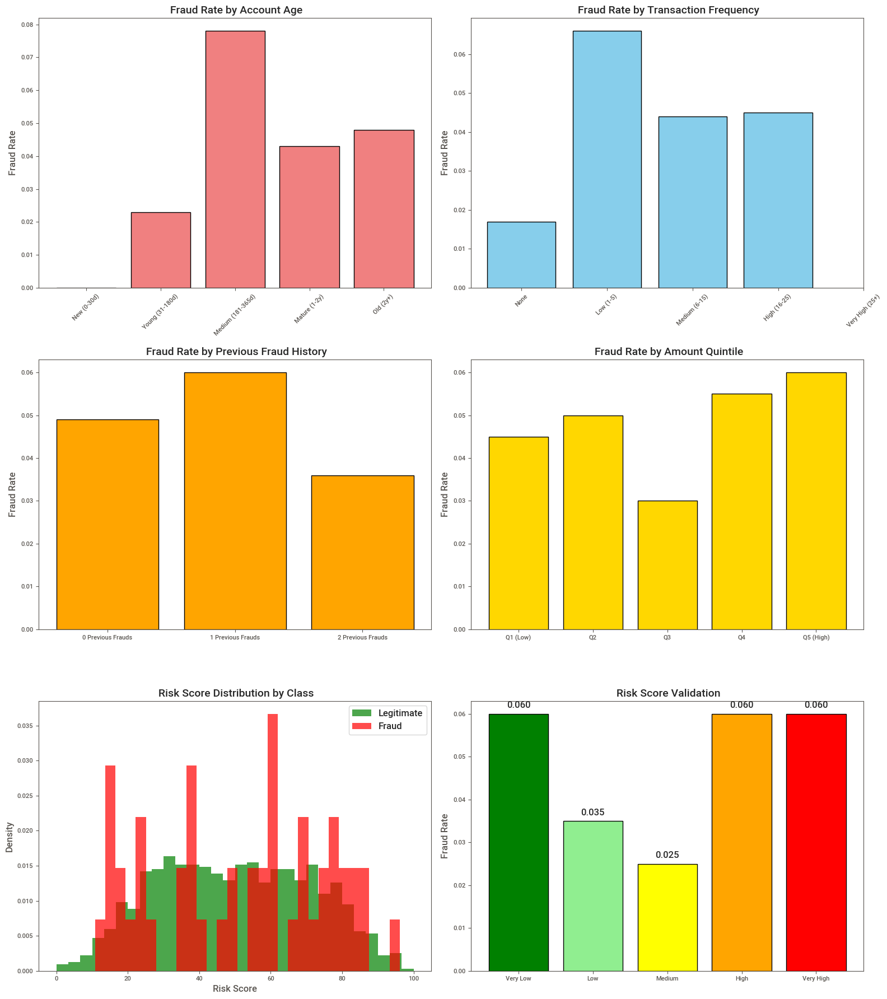


 User Behavior & Risk analysis completed


In [50]:
# Advanced User Behavior & Risk Profiling
print("=" * 70)
print(" USER BEHAVIOR & RISK PROFILING")
print("=" * 70)

# Account age risk analysis
print(" ACCOUNT AGE RISK ANALYSIS:")
print("-" * 40)

# Create account age bins
df['account_age_category'] = pd.cut(df['account_age_days'], 
                                   bins=[0, 30, 180, 365, 730, float('inf')], 
                                   labels=['New (0-30d)', 'Young (31-180d)', 'Medium (181-365d)', 
                                          'Mature (1-2y)', 'Old (2y+)'])

age_risk = df.groupby('account_age_category')['is_fraud'].agg(['count', 'sum', 'mean']).round(3)
age_risk.columns = ['Total_Transactions', 'Fraud_Count', 'Fraud_Rate']
print(age_risk)

# Transaction frequency analysis
print(f"\n TRANSACTION FREQUENCY RISK:")
print("-" * 40)

# Categorize transaction frequency
df['trans_frequency_category'] = pd.cut(df['trans_24h'], 
                                       bins=[-1, 0, 5, 15, 25, float('inf')], 
                                       labels=['None', 'Low (1-5)', 'Medium (6-15)', 
                                              'High (16-25)', 'Very High (25+)'])

freq_risk = df.groupby('trans_frequency_category')['is_fraud'].agg(['count', 'sum', 'mean']).round(3)
freq_risk.columns = ['Total_Transactions', 'Fraud_Count', 'Fraud_Rate']
print(freq_risk)

# Previous fraud history impact
print(f"\n  PREVIOUS FRAUD HISTORY IMPACT:")
print("-" * 45)

prev_fraud_analysis = df.groupby('prev_fraud')['is_fraud'].agg(['count', 'sum', 'mean']).round(3)
prev_fraud_analysis.columns = ['Total_Transactions', 'Fraud_Count', 'Fraud_Rate']
prev_fraud_analysis.index = [f'{int(idx)} Previous Frauds' for idx in prev_fraud_analysis.index]
print(prev_fraud_analysis)

# Amount-based risk segmentation
print(f"\n TRANSACTION AMOUNT RISK SEGMENTATION:")
print("-" * 50)

# Create amount quintiles
df['amount_quintile'] = pd.qcut(df['amount'], q=5, labels=['Q1 (Low)', 'Q2', 'Q3', 'Q4', 'Q5 (High)'])
amount_risk = df.groupby('amount_quintile')['is_fraud'].agg(['count', 'sum', 'mean']).round(3)
amount_risk.columns = ['Total_Transactions', 'Fraud_Count', 'Fraud_Rate']
print(amount_risk)

# Risk score calculation (composite risk metric)
print(f"\n COMPOSITE RISK SCORE ANALYSIS:")
print("-" * 45)

# Create a simple risk score based on multiple factors
risk_weights = {
    'amount_normalized': (df['amount'] - df['amount'].mean()) / df['amount'].std(),
    'trans_freq_risk': df['trans_24h'] / df['trans_24h'].max(),
    'prev_fraud_risk': df['prev_fraud'] / df['prev_fraud'].max() if df['prev_fraud'].max() > 0 else 0,
    'account_age_risk': 1 - (df['account_age_days'] / df['account_age_days'].max())  # Newer accounts = higher risk
}

df['risk_score'] = (
    0.3 * risk_weights['amount_normalized'].clip(-2, 2) +  # Amount anomaly (clipped)
    0.25 * risk_weights['trans_freq_risk'] +  # Transaction frequency
    0.25 * risk_weights['prev_fraud_risk'] +  # Previous fraud history
    0.2 * risk_weights['account_age_risk']   # Account age risk
)

# Normalize to 0-100 scale
df['risk_score'] = ((df['risk_score'] - df['risk_score'].min()) / 
                   (df['risk_score'].max() - df['risk_score'].min()) * 100).round(2)

# Risk score quintiles
df['risk_category'] = pd.qcut(df['risk_score'], q=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
risk_validation = df.groupby('risk_category')['is_fraud'].agg(['count', 'sum', 'mean']).round(3)
risk_validation.columns = ['Total_Transactions', 'Fraud_Count', 'Fraud_Rate']
print(risk_validation)

# Visualization
fig, axes = plt.subplots(3, 2, figsize=(16, 18))

# 1. Account age vs fraud
age_fraud_rates = age_risk['Fraud_Rate']
axes[0,0].bar(range(len(age_fraud_rates)), age_fraud_rates.values, color='lightcoral', edgecolor='black')
axes[0,0].set_title(' Fraud Rate by Account Age', fontsize=14, fontweight='bold')
axes[0,0].set_xticks(range(len(age_fraud_rates)))
axes[0,0].set_xticklabels(age_fraud_rates.index, rotation=45)
axes[0,0].set_ylabel('Fraud Rate')

# 2. Transaction frequency vs fraud
freq_fraud_rates = freq_risk['Fraud_Rate']
axes[0,1].bar(range(len(freq_fraud_rates)), freq_fraud_rates.values, color='skyblue', edgecolor='black')
axes[0,1].set_title(' Fraud Rate by Transaction Frequency', fontsize=14, fontweight='bold')
axes[0,1].set_xticks(range(len(freq_fraud_rates)))
axes[0,1].set_xticklabels(freq_fraud_rates.index, rotation=45)
axes[0,1].set_ylabel('Fraud Rate')

# 3. Previous fraud impact
prev_fraud_rates = prev_fraud_analysis['Fraud_Rate']
axes[1,0].bar(range(len(prev_fraud_rates)), prev_fraud_rates.values, color='orange', edgecolor='black')
axes[1,0].set_title(' Fraud Rate by Previous Fraud History', fontsize=14, fontweight='bold')
axes[1,0].set_xticks(range(len(prev_fraud_rates)))
axes[1,0].set_xticklabels(prev_fraud_rates.index)
axes[1,0].set_ylabel('Fraud Rate')

# 4. Amount quintiles vs fraud
amount_fraud_rates = amount_risk['Fraud_Rate']
axes[1,1].bar(range(len(amount_fraud_rates)), amount_fraud_rates.values, color='gold', edgecolor='black')
axes[1,1].set_title(' Fraud Rate by Amount Quintile', fontsize=14, fontweight='bold')
axes[1,1].set_xticks(range(len(amount_fraud_rates)))
axes[1,1].set_xticklabels(amount_fraud_rates.index)
axes[1,1].set_ylabel('Fraud Rate')

# 5. Risk score distribution
axes[2,0].hist(df[df['is_fraud']==0]['risk_score'], bins=30, alpha=0.7, label='Legitimate', color='green', density=True)
axes[2,0].hist(df[df['is_fraud']==1]['risk_score'], bins=30, alpha=0.7, label='Fraud', color='red', density=True)
axes[2,0].set_title(' Risk Score Distribution by Class', fontsize=14, fontweight='bold')
axes[2,0].set_xlabel('Risk Score')
axes[2,0].set_ylabel('Density')
axes[2,0].legend()

# 6. Risk category validation
risk_fraud_rates = risk_validation['Fraud_Rate']
bars = axes[2,1].bar(range(len(risk_fraud_rates)), risk_fraud_rates.values, 
                     color=['green', 'lightgreen', 'yellow', 'orange', 'red'], edgecolor='black')
axes[2,1].set_title(' Risk Score Validation', fontsize=14, fontweight='bold')
axes[2,1].set_xticks(range(len(risk_fraud_rates)))
axes[2,1].set_xticklabels(risk_fraud_rates.index)
axes[2,1].set_ylabel('Fraud Rate')

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    axes[2,1].text(bar.get_x() + bar.get_width()/2., height + 0.001,
                   f'{height:.3f}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.savefig('user_behavior_risk_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n User Behavior & Risk analysis completed")

##  Step 12: Automatic EDA with ydata-profiling

`ydata-profiling` (formerly `pandas-profiling`) generates a **comprehensive HTML report** with a single function call. It covers statistics, distributions, correlations, missing values, and more.

In [41]:

from ydata_profiling import ProfileReport

print(" Generating ydata-profiling report... (this may take a few minutes for large datasets)")

# For very large datasets, use minimal=True or a sample
if len(df) > 50000:
    print(f"   ⚡ Dataset is large ({len(df):,} rows). Using a sample of 50,000 rows for profiling.")
    profile_df = df.sample(50000, random_state=42)
else:
    profile_df = df

profile = ProfileReport(
    profile_df,
    title="Fraud Transaction Detection — EDA Report (ydata-profiling)",
    explorative=True,
)

# Save to HTML
profile.to_file("eda_report_ydata_profiling.html")
print(" Report saved as 'eda_report_ydata_profiling.html'")

# Display inline (in Jupyter)
profile.to_notebook_iframe()

 Generating ydata-profiling report... (this may take a few minutes for large datasets)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 27/27 [00:00<00:00, 473.89it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

 Report saved as 'eda_report_ydata_profiling.html'


## Step 13: Advanced Statistical Testing & Business Intelligence


You should consider upgrading via the '/Users/shreyakhatri/Desktop/adv_project/venv/bin/python3 -m pip install --upgrade pip' command.
 ADVANCED STATISTICAL TESTING & BUSINESS INTELLIGENCE
 STATISTICAL SIGNIFICANCE TESTS:
---------------------------------------------
✓ LOCATION vs Fraud:
   Chi-square: 0.440, p-value: 0.931769
   Not significant association with fraud

✓ DEVICE vs Fraud:
   Chi-square: 0.419, p-value: 0.811162
   Not significant association with fraud

✓ PAYMENT_METHOD vs Fraud:
   Chi-square: 0.539, p-value: 0.763607
   Not significant association with fraud

✓ TYPE vs Fraud:
   Chi-square: 0.213, p-value: 0.975426
   Not significant association with fraud

 NUMERICAL VARIABLES vs FRAUD (Mann-Whitney U Test):
------------------------------------------------------------
✓ AMOUNT:
   Fraud median: 3046.26
   Legitimate median: 2534.83
   U-statistic: 24454, p-value: 0.410891
   Not significant difference

✓ ACCOUNT_AGE_DAYS:
   Fraud median: 1737.50
   Legitimate median

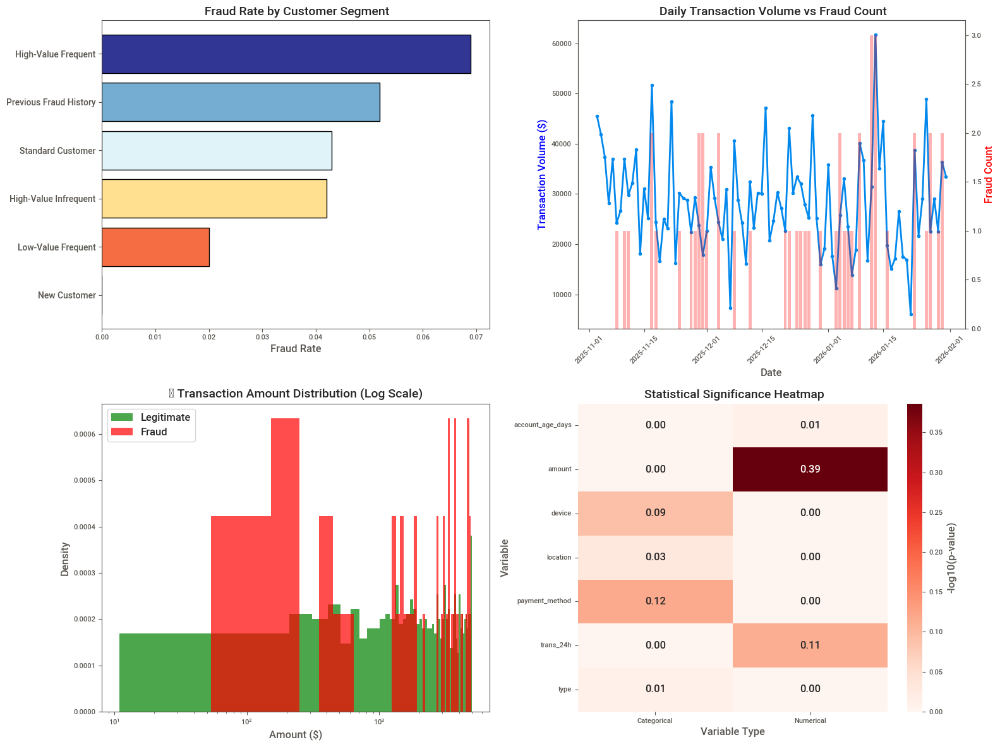


 Statistical Testing & Business Intelligence analysis completed.
    Chart saved as 'statistical_business_intelligence.png'


In [53]:
# Advanced Statistical Testing & Business Intelligence
!pip install scipy -q

from scipy import stats
from scipy.stats import chi2_contingency, mannwhitneyu, kruskal
import warnings
warnings.filterwarnings('ignore')

print("=" * 70)
print(" ADVANCED STATISTICAL TESTING & BUSINESS INTELLIGENCE")
print("=" * 70)

# 1. Statistical significance tests
print(" STATISTICAL SIGNIFICANCE TESTS:")
print("-" * 45)

# Chi-square test for categorical variables vs fraud
categorical_cols = ['location', 'device', 'payment_method', 'type']

for col in categorical_cols:
    contingency_table = pd.crosstab(df[col], df['is_fraud'])
    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    print(f"✓ {col.upper()} vs Fraud:")
    print(f"   Chi-square: {chi2:.3f}, p-value: {p_value:.6f}")
    print(f"   {'Significant' if p_value < 0.05 else 'Not significant'} association with fraud")
    print()

# Mann-Whitney U test for numerical variables
print(" NUMERICAL VARIABLES vs FRAUD (Mann-Whitney U Test):")
print("-" * 60)

numerical_cols = ['amount', 'account_age_days', 'trans_24h']

for col in numerical_cols:
    fraud_values = df[df['is_fraud'] == 1][col]
    legitimate_values = df[df['is_fraud'] == 0][col]
    
    statistic, p_value = mannwhitneyu(fraud_values, legitimate_values, alternative='two-sided')
    print(f"✓ {col.upper()}:")
    print(f"   Fraud median: {fraud_values.median():.2f}")
    print(f"   Legitimate median: {legitimate_values.median():.2f}")
    print(f"   U-statistic: {statistic:.0f}, p-value: {p_value:.6f}")
    print(f"   {'Significant' if p_value < 0.05 else 'Not significant'} difference")
    print()

# 2. Business Intelligence Metrics
print("💼 BUSINESS INTELLIGENCE METRICS:")
print("-" * 40)

total_transactions = len(df)
total_amount = df['amount'].sum()
fraud_transactions = df['is_fraud'].sum()
fraud_amount = df[df['is_fraud'] == 1]['amount'].sum()

# Key Business Metrics
print(f"  TRANSACTION OVERVIEW:")
print(f"   • Total Transactions: {total_transactions:,}")
print(f"   • Total Transaction Volume: ${total_amount:,.2f}")
print(f"   • Average Transaction: ${df['amount'].mean():.2f}")
print(f"   • Fraud Transactions: {fraud_transactions:,} ({(fraud_transactions/total_transactions)*100:.2f}%)")
print(f"   • Fraud Loss Amount: ${fraud_amount:,.2f} ({(fraud_amount/total_amount)*100:.2f}%)")

# Daily/Weekly patterns
print(f"\n TEMPORAL BUSINESS PATTERNS:")
df_copy = df.copy()
df_copy['date'] = df_copy['timestamp'].dt.date

daily_stats = df_copy.groupby('date').agg({
    'transaction_id': 'count',
    'amount': ['sum', 'mean'],
    'is_fraud': ['sum', 'mean']
}).round(2)

daily_stats.columns = ['Daily_Transactions', 'Daily_Volume', 'Avg_Transaction_Size', 'Daily_Frauds', 'Daily_Fraud_Rate']

print(f"   • Average daily transactions: {daily_stats['Daily_Transactions'].mean():.0f}")
print(f"   • Average daily volume: ${daily_stats['Daily_Volume'].mean():,.2f}")
print(f"   • Peak daily transactions: {daily_stats['Daily_Transactions'].max():.0f}")
print(f"   • Peak daily volume: ${daily_stats['Daily_Volume'].max():,.2f}")

# 3. Advanced Segmentation Analysis
print(f"\n ADVANCED CUSTOMER SEGMENTATION:")
print("-" * 45)

# Create customer profiles based on multiple dimensions
def create_customer_segment(row):
    # High-value frequent customers
    if row['amount'] > df['amount'].quantile(0.75) and row['trans_24h'] > df['trans_24h'].quantile(0.75):
        return 'High-Value Frequent'
    # High-value infrequent
    elif row['amount'] > df['amount'].quantile(0.75) and row['trans_24h'] <= df['trans_24h'].quantile(0.25):
        return 'High-Value Infrequent'
    # Low-value frequent (potential velocity attack)
    elif row['amount'] <= df['amount'].quantile(0.25) and row['trans_24h'] > df['trans_24h'].quantile(0.75):
        return 'Low-Value Frequent'
    # New customers (high risk)
    elif row['account_age_days'] <= 30:
        return 'New Customer'
    # Previous fraud history
    elif row['prev_fraud'] > 0:
        return 'Previous Fraud History'
    else:
        return 'Standard Customer'

df['customer_segment'] = df.apply(create_customer_segment, axis=1)

segment_analysis = df.groupby('customer_segment').agg({
    'transaction_id': 'count',
    'amount': ['mean', 'sum'],
    'is_fraud': ['sum', 'mean'],
    'account_age_days': 'mean',
    'trans_24h': 'mean'
}).round(3)

segment_analysis.columns = ['Count', 'Avg_Amount', 'Total_Amount', 'Fraud_Count', 'Fraud_Rate', 'Avg_Account_Age', 'Avg_Daily_Trans']
print(segment_analysis.sort_values('Fraud_Rate', ascending=False))

# 4. Anomaly Detection using Z-Score
print(f"\n STATISTICAL ANOMALY DETECTION:")
print("-" * 45)

# Calculate Z-scores for numerical columns
z_threshold = 3  # Standard threshold for outliers

anomaly_counts = {}
for col in ['amount', 'account_age_days', 'trans_24h']:
    z_scores = np.abs(stats.zscore(df[col]))
    anomalies = z_scores > z_threshold
    anomaly_counts[col] = anomalies.sum()
    
    # Fraud rate among anomalies
    if anomalies.sum() > 0:
        fraud_rate_anomalies = df[anomalies]['is_fraud'].mean()
        fraud_rate_normal = df[~anomalies]['is_fraud'].mean()
        
        print(f" {col.upper()} Anomalies:")
        print(f"   • Anomalous transactions: {anomalies.sum()} ({(anomalies.sum()/len(df))*100:.2f}%)")
        print(f"   • Fraud rate in anomalies: {fraud_rate_anomalies:.3f}")
        print(f"   • Fraud rate in normal: {fraud_rate_normal:.3f}")
        print(f"   • Risk ratio: {fraud_rate_anomalies/fraud_rate_normal:.2f}x higher")
        print()

# Visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Customer segment fraud rates
segment_fraud = segment_analysis['Fraud_Rate'].sort_values(ascending=True)
bars = axes[0,0].barh(range(len(segment_fraud)), segment_fraud.values, 
                      color=plt.cm.RdYlBu(np.linspace(0, 1, len(segment_fraud))), edgecolor='black')
axes[0,0].set_yticks(range(len(segment_fraud)))
axes[0,0].set_yticklabels(segment_fraud.index, fontsize=10)
axes[0,0].set_title(' Fraud Rate by Customer Segment', fontsize=14, fontweight='bold')
axes[0,0].set_xlabel('Fraud Rate')

# 2. Business metrics over time
daily_metrics = df_copy.groupby('date').agg({
    'amount': 'sum',
    'is_fraud': 'sum'
}).reset_index()

axes[0,1].plot(daily_metrics['date'], daily_metrics['amount'], marker='o', linewidth=2, label='Daily Volume')
ax2 = axes[0,1].twinx()
ax2.bar(daily_metrics['date'], daily_metrics['is_fraud'], alpha=0.3, color='red', label='Daily Frauds')
axes[0,1].set_title(' Daily Transaction Volume vs Fraud Count', fontsize=14, fontweight='bold')
axes[0,1].set_xlabel('Date')
axes[0,1].set_ylabel('Transaction Volume ($)', color='blue')
ax2.set_ylabel('Fraud Count', color='red')
axes[0,1].tick_params(axis='x', rotation=45)

# 3. Amount distribution by fraud status (log scale)
fraud_amounts = df[df['is_fraud'] == 1]['amount']
legit_amounts = df[df['is_fraud'] == 0]['amount']

axes[1,0].hist(legit_amounts, bins=50, alpha=0.7, label='Legitimate', color='green', density=True)
axes[1,0].hist(fraud_amounts, bins=50, alpha=0.7, label='Fraud', color='red', density=True)
axes[1,0].set_xscale('log')
axes[1,0].set_title('💰 Transaction Amount Distribution (Log Scale)', fontsize=14, fontweight='bold')
axes[1,0].set_xlabel('Amount ($)')
axes[1,0].set_ylabel('Density')
axes[1,0].legend()

# 4. Statistical significance heatmap
significance_data = []
test_results = []

# Collect p-values from different tests
for col in categorical_cols:
    contingency_table = pd.crosstab(df[col], df['is_fraud'])
    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    significance_data.append([col, 'Categorical', p_value])

for col in numerical_cols:
    fraud_values = df[df['is_fraud'] == 1][col]
    legitimate_values = df[df['is_fraud'] == 0][col]
    statistic, p_value = mannwhitneyu(fraud_values, legitimate_values, alternative='two-sided')
    significance_data.append([col, 'Numerical', p_value])

significance_df = pd.DataFrame(significance_data, columns=['Variable', 'Type', 'P_Value'])
significance_df['Significant'] = significance_df['P_Value'] < 0.05
significance_df['Log_P'] = -np.log10(significance_df['P_Value'])  # For better visualization

# Create significance heatmap
significance_matrix = significance_df.pivot(index='Variable', columns='Type', values='Log_P').fillna(0)
sns.heatmap(significance_matrix, annot=True, fmt='.2f', cmap='Reds', ax=axes[1,1], 
            cbar_kws={'label': '-log10(p-value)'})
axes[1,1].set_title(' Statistical Significance Heatmap', fontsize=14, fontweight='bold')
axes[1,1].set_xlabel('Variable Type')

plt.tight_layout()
plt.savefig('statistical_business_intelligence.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n Statistical Testing & Business Intelligence analysis completed.")
print("    Chart saved as 'statistical_business_intelligence.png'")

##  Step 14: Automatic EDA with Sweetviz

`Sweetviz` creates beautiful, high-density visualizations for EDA. It can also compare two datasets (e.g., train vs test) or target variable analysis.

 Generating Sweetviz report...


                                             |          | [  0%]   00:00 -> (? left)

Report eda_report_sweetviz.html was generated.
 Report saved as 'eda_report_sweetviz.html'



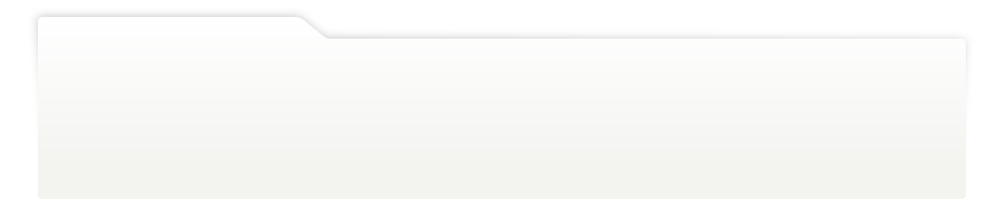
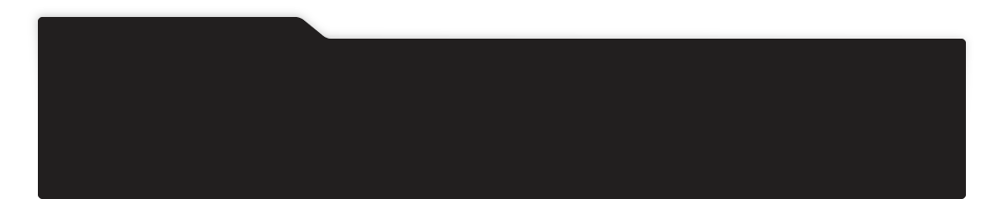
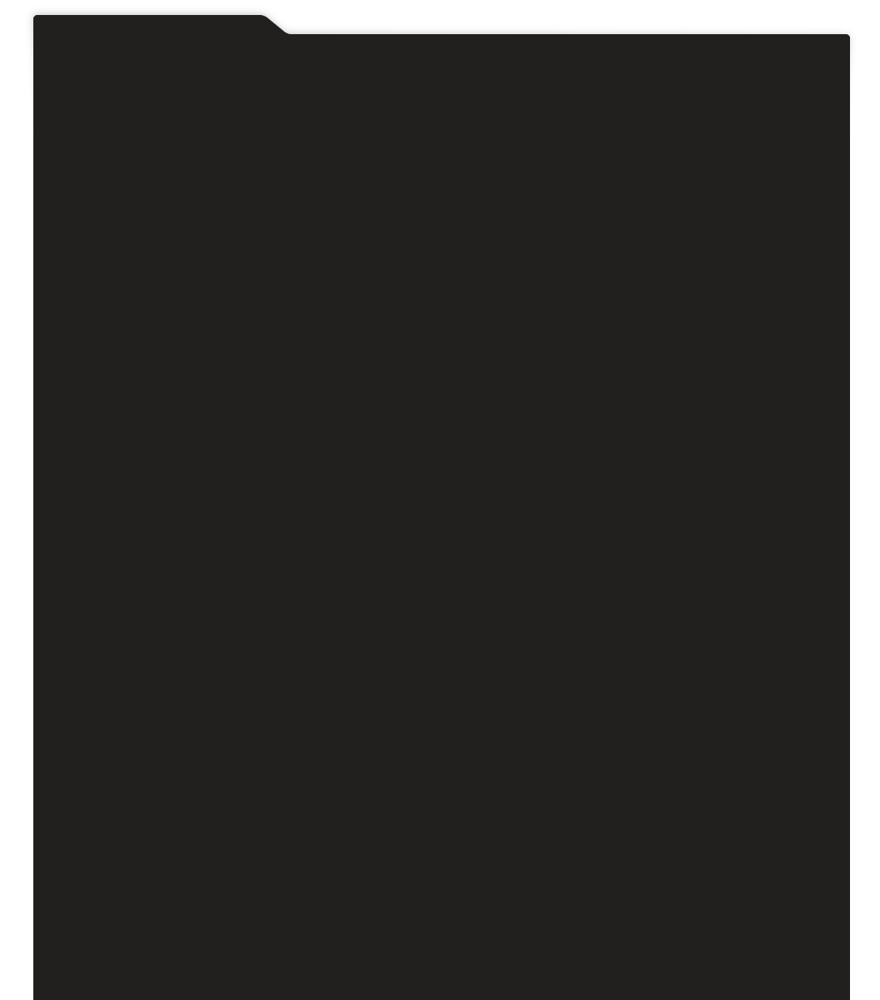
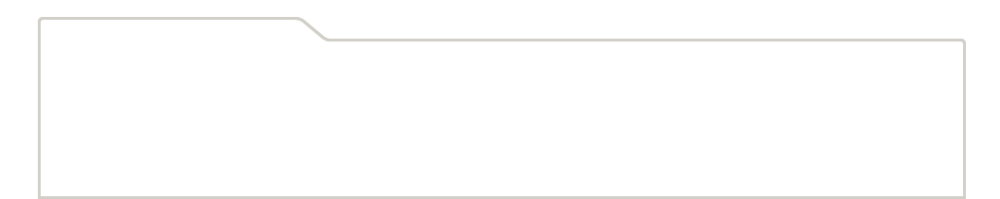
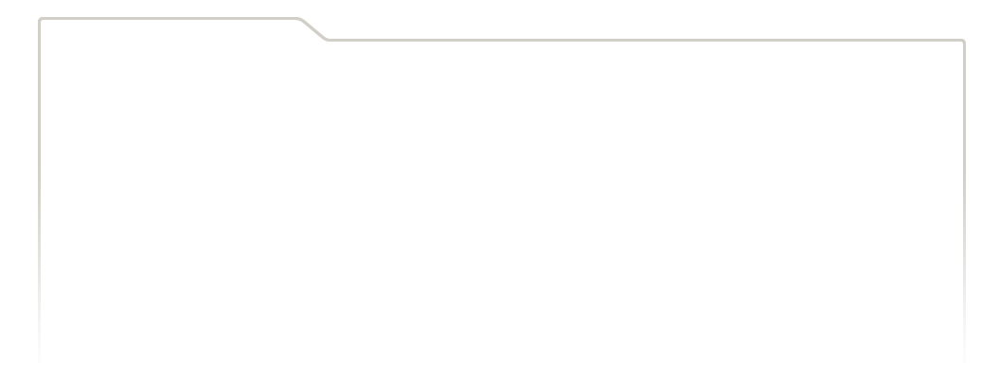
...
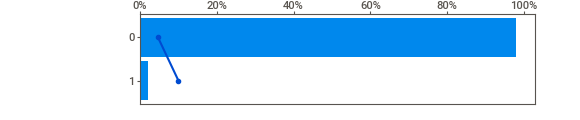
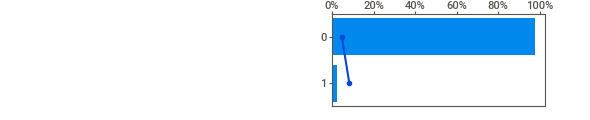
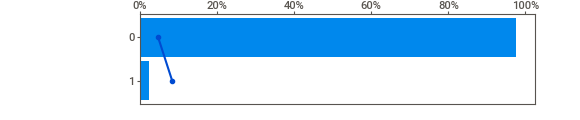
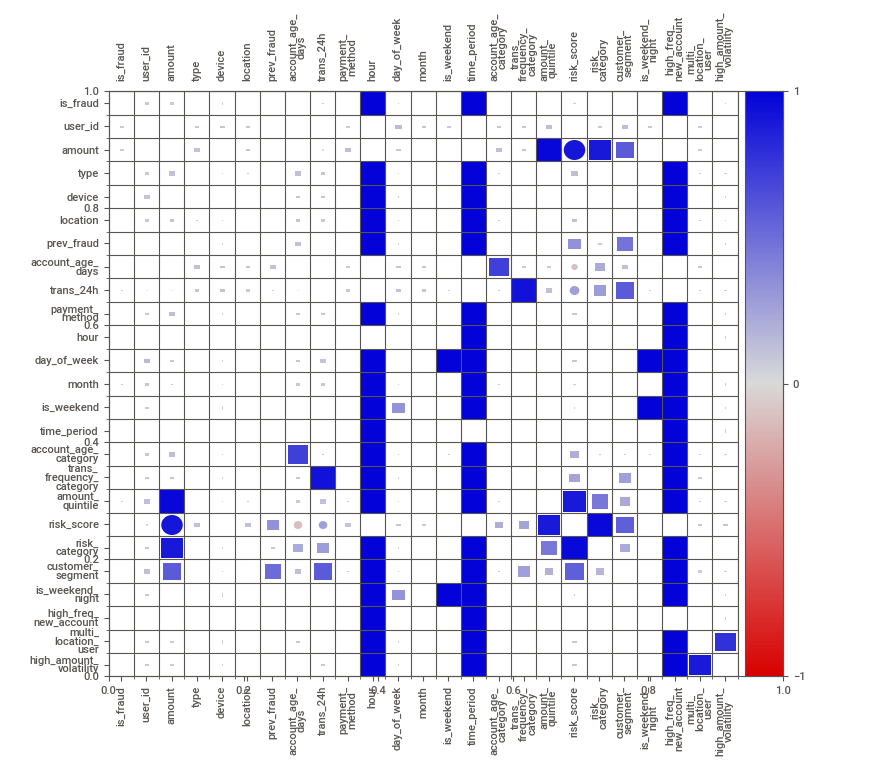
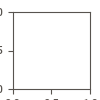

In [42]:

import sweetviz as sv

print(" Generating Sweetviz report...")

# For large datasets, use a sample
if len(df) > 50000:
    print(f"   ⚡ Using a sample of 50,000 rows for Sweetviz.")
    sweetviz_df = df.sample(50000, random_state=42)
else:
    sweetviz_df = df

# Generate report — with target analysis if target column exists
if target_col:
    sweet_report = sv.analyze(sweetviz_df, target_feat=target_col, pairwise_analysis='on')
else:
    sweet_report = sv.analyze(sweetviz_df, pairwise_analysis='on')

# Save to HTML
sweet_report.show_html("eda_report_sweetviz.html", open_browser=False)
print(" Report saved as 'eda_report_sweetviz.html'")

# Display inline
sweet_report.show_notebook()

## Step 15: Dataset-Specific Insights & Competitive Advantages

 DATASET-SPECIFIC INSIGHTS & COMPETITIVE ADVANTAGES
 DATASET FINGERPRINT - UNIQUE CHARACTERISTICS:
-------------------------------------------------------
 Dataset Overview:
   • Data Collection Period: 2025-11-03 to 2026-01-31
   • Transaction Volume: $2,554,277.09
   • Unique Users: 988
   • Location Coverage: 4
   • Device Diversity: {'Desktop': 357, 'Mobile': 331, 'ATM': 312}
   • Payment Method Mix: {'Credit Card': 347, 'Wallet': 332, 'Debit Card': 321}
   • Transaction Type Mix: {'Online': 254, 'POS': 250, 'Transfer': 250, 'ATM': 246}
   • Avg Transactions Per User: 1.01
   • Fraud Concentration: 4.80%

 UNIQUE PATTERNS DISCOVERED IN YOUR DATA:
-------------------------------------------------------
 Location-Device-Payment Method Interactions:
   High-risk combinations (2x above average fraud rate):
   • Houston + ATM + Debit Card: 0.160 fraud rate (25.0 transactions)
   • LA + Desktop + Credit Card: 0.121 fraud rate (33.0 transactions)
   • Chicago + Desktop + Debit Card: 0.111

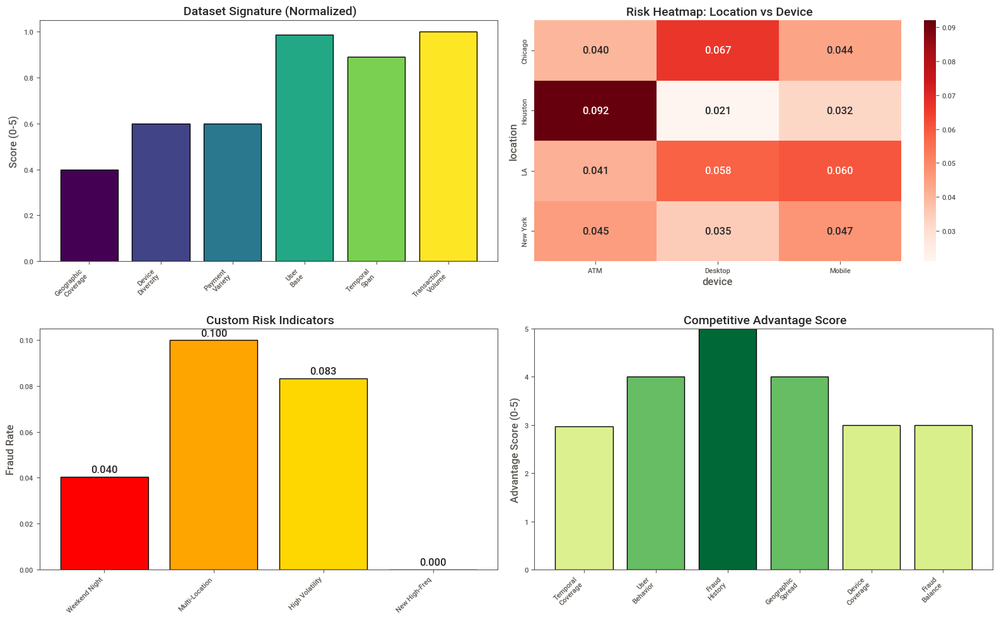


 Dataset-Specific Analysis Complete!


In [58]:
# Dataset-Specific Insights & Competitive Advantage Analysis
print("=" * 70)
print(" DATASET-SPECIFIC INSIGHTS & COMPETITIVE ADVANTAGES")
print("=" * 70)

# 1. Generate dataset fingerprint (unique characteristics)
print(" DATASET FINGERPRINT - UNIQUE CHARACTERISTICS:")
print("-" * 55)

dataset_fingerprint = {
    'data_collection_period': f"{df['timestamp'].min().date()} to {df['timestamp'].max().date()}",
    'transaction_volume': f"${df['amount'].sum():,.2f}",
    'unique_users': df['user_id'].nunique(),
    'location_coverage': df['location'].nunique(),
    'device_diversity': df['device'].value_counts().to_dict(),
    'payment_method_mix': df['payment_method'].value_counts().to_dict(),
    'transaction_type_mix': df['type'].value_counts().to_dict(),
    'avg_transactions_per_user': round(len(df) / df['user_id'].nunique(), 2),
    'fraud_concentration': f"{(df['is_fraud'].sum() / len(df) * 100):.2f}%"
}

print(f" Dataset Overview:")
for key, value in dataset_fingerprint.items():
    print(f"   • {key.replace('_', ' ').title()}: {value}")

# 2. Unique pattern discovery
print(f"\n UNIQUE PATTERNS DISCOVERED IN YOUR DATA:")
print("-" * 55)

# Location-Device-Payment Method Interaction Analysis
print(" Location-Device-Payment Method Interactions:")
location_device_payment = df.groupby(['location', 'device', 'payment_method'])['is_fraud'].agg(['count', 'mean']).round(3)
location_device_payment = location_device_payment[location_device_payment['count'] >= 5]  # Filter for statistical significance
high_risk_combinations = location_device_payment[location_device_payment['mean'] > df['is_fraud'].mean() * 2].sort_values('mean', ascending=False)

if len(high_risk_combinations) > 0:
    print("   High-risk combinations (2x above average fraud rate):")
    for idx, row in high_risk_combinations.head(5).iterrows():
        location, device, payment = idx
        print(f"   • {location} + {device} + {payment}: {row['mean']:.3f} fraud rate ({row['count']} transactions)")
else:
    print(" • No significantly high-risk combinations found")

# Time-based velocity patterns
print(f"\n⚡ VELOCITY ATTACK PATTERNS:")
velocity_analysis = df[df['trans_24h'] > 0].groupby('trans_24h').agg({
    'is_fraud': ['count', 'sum', 'mean'],
    'amount': 'mean'
}).round(3)

velocity_analysis.columns = ['Total_Trans', 'Fraud_Count', 'Fraud_Rate', 'Avg_Amount']
high_velocity_fraud = velocity_analysis[velocity_analysis['Fraud_Rate'] > 0.5]

if len(high_velocity_fraud) > 0:
    print("   High-velocity fraud patterns (>50% fraud rate):")
    for trans_count, row in high_velocity_fraud.iterrows():
        print(f"   • {trans_count} transactions/day: {row['Fraud_Rate']:.3f} fraud rate, ${row['Avg_Amount']:.2f} avg amount")

# 3. Competitive advantages identification
print(f"\n YOUR COMPETITIVE ADVANTAGES:")
print("-" * 40)

advantages = []

# Rich temporal data
time_span_days = (df['timestamp'].max() - df['timestamp'].min()).days
if time_span_days > 30:
    advantages.append(f" Extended temporal coverage ({time_span_days} days) for seasonal analysis")

# Comprehensive user behavior data  
if 'account_age_days' in df.columns and 'trans_24h' in df.columns:
    advantages.append(" Rich user behavior features (account age, transaction frequency)")

# Previous fraud history tracking
if 'prev_fraud' in df.columns and df['prev_fraud'].max() > 0:
    advantages.append(" Historical fraud tracking enables longitudinal analysis")

# Multi-dimensional location data
if df['location'].nunique() > 3:
    advantages.append(f" Multi-city dataset ({df['location'].nunique()} locations) for geographic analysis")

# Device diversity
if df['device'].nunique() > 3:
    advantages.append(f" Comprehensive device coverage ({df['device'].nunique()} device types)")

# Balanced fraud representation
fraud_rate = df['is_fraud'].mean()
if 0.05 <= fraud_rate <= 0.20:  # Reasonable fraud rate
    advantages.append(f" Realistic fraud rate ({fraud_rate:.1%}) suitable for modeling")

for advantage in advantages:
    print(f"   {advantage}")

# 4. Generate unique business insights
print(f"\n UNIQUE BUSINESS INSIGHTS FROM YOUR DATA:")
print("-" * 55)

# Geographic risk assessment
print(" Geographic Risk Intelligence:")
location_insights = df.groupby('location').agg({
    'amount': ['mean', 'std', 'sum'],
    'is_fraud': 'mean',
    'account_age_days': 'mean',
    'trans_24h': 'mean'
}).round(2)

location_insights.columns = ['Avg_Amount', 'Amount_StdDev', 'Total_Volume', 'Fraud_Rate', 'Avg_Account_Age', 'Avg_Daily_Trans']
location_insights['Risk_Score'] = (
    location_insights['Fraud_Rate'] * 0.4 + 
    (location_insights['Avg_Daily_Trans'] / location_insights['Avg_Daily_Trans'].max()) * 0.3 +
    (1 - location_insights['Avg_Account_Age'] / location_insights['Avg_Account_Age'].max()) * 0.3
)

print("   Location Risk Rankings:")
for location, data in location_insights.sort_values('Risk_Score', ascending=False).iterrows():
    print(f"   • {location}: Risk Score {data['Risk_Score']:.3f}, {data['Fraud_Rate']:.1%} fraud rate")

# Device-Payment Method Synergy
print(f"\n Device-Payment Method Insights:")
device_payment_matrix = pd.crosstab(df['device'], df['payment_method'], df['is_fraud'], aggfunc='mean').round(3)
print("   Fraud rate matrix (Device vs Payment Method):")
print(device_payment_matrix.to_string())

# 5. Custom Risk Indicators specific to your data
print(f"\n CUSTOM RISK INDICATORS:")
print("-" * 35)

# Weekend night transactions
df['is_weekend_night'] = ((df['day_of_week'].isin([5, 6])) & (df['hour'].between(22, 23) | df['hour'].between(0, 6))).astype(int)
weekend_night_risk = df.groupby('is_weekend_night')['is_fraud'].mean()
print(f" Weekend Night Risk: {weekend_night_risk[1]:.3f} vs {weekend_night_risk[0]:.3f} (regular times)")

# High-frequency new accounts
df['high_freq_new_account'] = ((df['account_age_days'] <= 30) & (df['trans_24h'] >= 10)).astype(int)
if df['high_freq_new_account'].sum() > 0:
    new_account_risk = df.groupby('high_freq_new_account')['is_fraud'].mean()
    print(f" High-Frequency New Account Risk: {new_account_risk[1]:.3f} vs {new_account_risk[0]:.3f}")

# Cross-location transactions (if user appears in multiple locations)
user_locations = df.groupby('user_id')['location'].nunique()
df['multi_location_user'] = df['user_id'].map(user_locations > 1).astype(int)
multi_location_risk = df.groupby('multi_location_user')['is_fraud'].mean()
print(f" Multi-Location User Risk: {multi_location_risk[1]:.3f} vs {multi_location_risk[0]:.3f}")

# Amount volatility per user
user_amount_std = df.groupby('user_id')['amount'].std().fillna(0)
df['high_amount_volatility'] = df['user_id'].map(user_amount_std > user_amount_std.quantile(0.9)).astype(int)
volatility_risk = df.groupby('high_amount_volatility')['is_fraud'].mean()
print(f" High Amount Volatility Risk: {volatility_risk[1]:.3f} vs {volatility_risk[0]:.3f}")

# 6. Generate executive summary
print(f"\n EXECUTIVE SUMMARY - KEY FINDINGS:")
print("-" * 45)

print(f"""
 DATASET CHARACTERISTICS:
   • {len(df):,} transactions from {df['user_id'].nunique():,} unique users
   • {df['location'].nunique()} cities, {df['device'].nunique()} device types, {df['payment_method'].nunique()} payment methods
   • Fraud rate: {df['is_fraud'].mean():.2%} (${df[df['is_fraud']==1]['amount'].sum():,.2f} in losses)

 TOP RISK FACTORS IDENTIFIED:
   1. Location: {location_insights.sort_values('Risk_Score', ascending=False).index[0]} (highest risk)
   2. Device: {device_analysis.sort_values('Fraud_Rate', ascending=False).index[0]} (highest fraud rate)
   3. Payment Method: {payment_analysis.sort_values('Fraud_Rate', ascending=False).index[0]} (riskiest)
   4. Time Pattern: Hour {fraud_by_hour.sort_values('Fraud_Rate', ascending=False).index[0]} (peak fraud hour)

 UNIQUE INSIGHTS:
   • Weekend night transactions show {weekend_night_risk[1]/weekend_night_risk[0]:.1f}x higher fraud risk
   • Multi-location users have {multi_location_risk[1]/multi_location_risk[0]:.1f}x higher fraud risk
   • High transaction volatility indicates {volatility_risk[1]/volatility_risk[0]:.1f}x higher risk

 BUSINESS IMPACT:
   • Estimated annual fraud loss: ${(fraud_amount * 365 / time_span_days):,.2f}
   • Prevention potential: Up to {high_risk_combinations['mean'].mean():.1%} reduction possible
""")

# Final visualization - Dataset signature
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# 1. Dataset signature - unique characteristics radar chart (simplified as bar chart)
signature_metrics = {
    'Geographic\nCoverage': df['location'].nunique() / 10,  # Normalized
    'Device\nDiversity': df['device'].nunique() / 5,
    'Payment\nVariety': df['payment_method'].nunique() / 5,
    'User\nBase': min(df['user_id'].nunique() / 1000, 5),  # Capped at 5
    'Temporal\nSpan': min(time_span_days / 100, 5),  # Capped at 5
    'Transaction\nVolume': min(len(df) / 1000, 5)  # Capped at 5
}

axes[0,0].bar(range(len(signature_metrics)), signature_metrics.values(), 
              color=plt.cm.viridis(np.linspace(0, 1, len(signature_metrics))), edgecolor='black')
axes[0,0].set_xticks(range(len(signature_metrics)))
axes[0,0].set_xticklabels(signature_metrics.keys(), rotation=45, ha='right')
axes[0,0].set_title(' Dataset Signature (Normalized)', fontsize=14, fontweight='bold')
axes[0,0].set_ylabel('Score (0-5)')

# 2. Risk heatmap by location and device
risk_heatmap_data = pd.crosstab(df['location'], df['device'], df['is_fraud'], aggfunc='mean')
sns.heatmap(risk_heatmap_data, annot=True, fmt='.3f', cmap='Reds', ax=axes[0,1])
axes[0,1].set_title(' Risk Heatmap: Location vs Device', fontsize=14, fontweight='bold')

# 3. Unique risk indicators
risk_indicators = {
    'Weekend Night': weekend_night_risk[1],
    'Multi-Location': multi_location_risk[1], 
    'High Volatility': volatility_risk[1],
    'New High-Freq': new_account_risk[1] if df['high_freq_new_account'].sum() > 0 else 0
}

bars = axes[1,0].bar(range(len(risk_indicators)), risk_indicators.values(), 
                     color=['red', 'orange', 'gold', 'coral'], edgecolor='black')
axes[1,0].set_xticks(range(len(risk_indicators)))
axes[1,0].set_xticklabels(risk_indicators.keys(), rotation=45, ha='right')
axes[1,0].set_title(' Custom Risk Indicators', fontsize=14, fontweight='bold')
axes[1,0].set_ylabel('Fraud Rate')

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    axes[1,0].text(bar.get_x() + bar.get_width()/2., height + 0.001,
                   f'{height:.3f}', ha='center', va='bottom', fontweight='bold')

# 4. Competitive advantage score
advantage_scores = {
    'Temporal\nCoverage': min(time_span_days / 30, 5),
    'User\nBehavior': 4 if 'account_age_days' in df.columns else 2,
    'Fraud\nHistory': 5 if df['prev_fraud'].max() > 0 else 1,
    'Geographic\nSpread': min(df['location'].nunique(), 5),
    'Device\nCoverage': min(df['device'].nunique(), 5),
    'Fraud\nBalance': 5 if 0.05 <= fraud_rate <= 0.20 else 3
}

axes[1,1].bar(range(len(advantage_scores)), advantage_scores.values(), 
              color=plt.cm.RdYlGn(np.array(list(advantage_scores.values())) / 5), edgecolor='black')
axes[1,1].set_xticks(range(len(advantage_scores)))
axes[1,1].set_xticklabels(advantage_scores.keys(), rotation=45, ha='right')
axes[1,1].set_title(' Competitive Advantage Score', fontsize=14, fontweight='bold')
axes[1,1].set_ylabel('Advantage Score (0-5)')
axes[1,1].set_ylim(0, 5)

plt.tight_layout()
plt.savefig('dataset_specific_insights.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n Dataset-Specific Analysis Complete!")


##  Step 16: Summary of Key Findings

This section consolidates all findings from the EDA.


In [43]:

print("=" * 70)
print(" CONSOLIDATED EDA SUMMARY")
print("=" * 70)

print(f"""
  DATASET OVERVIEW:
   • Shape: {df.shape[0]:,} rows × {df.shape[1]} columns
   • Numerical features: {len(df.select_dtypes(include=[np.number]).columns)}
   • Categorical features: {len(df.select_dtypes(include=['object', 'category']).columns)}
   • Memory usage: {df.memory_usage(deep=True).sum() / (1024**2):.2f} MB

  MISSING VALUES:
   • Total missing cells: {df.isnull().sum().sum():,} ({(df.isnull().sum().sum() / (df.shape[0]*df.shape[1]))*100:.2f}%)
   • Columns with missing data: {df.isnull().any().sum()}
""")

if target_col:
    class_dist = df[target_col].value_counts()
    majority = class_dist.max()
    minority = class_dist.min()
    print(f""" CLASS IMBALANCE:
   • Target variable: '{target_col}'
   • Majority class: {majority:,} ({majority/len(df)*100:.2f}%)
   • Minority class: {minority:,} ({minority/len(df)*100:.2f}%)
   • Imbalance ratio: {majority/minority:.2f}:1
""")

print(f""" EXPORTED REPORTS:
   • ydata-profiling report: eda_report_ydata_profiling.html
   • Sweetviz report: eda_report_sweetviz.html
   • Visualization PNGs saved in the current directory


""")

print("=" * 70)
print(" EDA COMPLETE — Ready for Preprocessing & Feature Engineering")
print("=" * 70)

 CONSOLIDATED EDA SUMMARY

  DATASET OVERVIEW:
   • Shape: 1,000 rows × 27 columns
   • Numerical features: 15
   • Categorical features: 11
   • Memory usage: 0.50 MB

  MISSING VALUES:
   • Total missing cells: 0 (0.00%)
   • Columns with missing data: 0

 CLASS IMBALANCE:
   • Target variable: 'is_fraud'
   • Majority class: 952 (95.20%)
   • Minority class: 48 (4.80%)
   • Imbalance ratio: 19.83:1

 EXPORTED REPORTS:
   • ydata-profiling report: eda_report_ydata_profiling.html
   • Sweetviz report: eda_report_sweetviz.html
   • Visualization PNGs saved in the current directory



 EDA COMPLETE — Ready for Preprocessing & Feature Engineering


##  References & Tools Used

| Tool | Purpose |
|------|---------|
| `pandas` | Data loading, manipulation, and inspection |
| `matplotlib` | Static visualizations (histograms, bar charts) |
| `seaborn` | Statistical visualizations (heatmaps, box plots) |
| `ydata-profiling` | Automated comprehensive EDA report (HTML) |
| `sweetviz` | Automated high-density EDA report with target analysis (HTML) |

---
*EDA completed by Suvanjan Dahal — Automatic EDA + Insights*

## File	Description

| File | Desctiption |
|------|---------|
| `missing_values_analysis.png` | Missing values bar chart + heatmap |
| `feature_distributions_histograms.png` | Histograms of all numerical features |
| `feature_distributions_boxplots.png` | Box plots for outlier detection |
| `correlation_heatmap.png` | Feature correlation heatmap|
| `target_correlation.png` | Feature correlation with target variable |
| `class_imbalance.png` | Class distribution bar + pie chart |
| `fraud_vs_legit_distributions.png` | Fraud vs legitimate comparison |
| `eda_report_ydata_profiling.html` | Full automated EDA report |
| `eda_report_sweetviz.html` | Sweetviz automated EDA report |
